In [1]:
set.seed(777)

#Load Libraries
library(Seurat)
library(SeuratDisk)
library(sctransform)
library(ggplot2)
library(patchwork)
library(RColorBrewer)
library(ComplexHeatmap)
library(S4Vectors)
library(future)
library(dplyr)
library(stringr)
library(cowplot)
library(harmony)
#library(DESeq2)
library(Signac)
library(monocle3)
library(Matrix)
library(SeuratWrappers)

#Set working directory
setwd("/storage1/fs1/jmillman/Active/DigitalTwin")

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, saveRDS


Loading Seurat v5 beta version 
To maintain compatibility with previous workflows, new Seurat objects will use the previous object structure by default
To use new Seurat v5 assays please run: options(Seurat.object.assay.version = 'v5')

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Loading required package: grid

ComplexHeatmap version 2.15.4
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinfo

In [2]:
pal_celltype <- c(
  "Mesench." = "#ffbd00",  # yellow
  "Prolif."  = "#CC6677", # dusty rose / muted red
  "DE"       = "#a7defa", # light sky blue
  "GT"       = "#DDCC77", # warm sand / golden khaki
  "PP"       = "#402bad", # deep indigo
  "Exocrine" = "#117733", # forest green
  "UE"       = "#EE3377", # magenta / raspberry
  "eEP"      = "#fcb686", # light orange
  "lEP"      = '#cd853f', #Peru color
  "EC"       = "#015f94", # royal blue
  #"eEC"      = "#16baf7", # sky blue
  #"Beta-EC"     = "#AA4499", # plum / purple-rose
  #"eBeta"       = "#f77785", # light red
  "Beta"        = "#ba0c2f", # WashU red
  "Delta"        = "#7d9e31", # olive
  "Alpha"        = "#f55e07" # vivid orange
)

# Prepare subsets

In [3]:
i <- readRDS("checkpoints/DT_muon_annotated.rds")

i
# count the frequency of each unique value of 'orig.ident'
cell_count <- table(i@meta.data$orig.ident)
cell_count

An object of class Seurat 
95325 features across 400603 samples within 2 assays 
Active assay: RNA (17015 features, 5000 variable features)
 2 layers present: counts, data
 1 other assay present: ATAC
 17 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi


     balboa.s5dt   balboa.s7w0a11    balboa.s7w0b3    balboa.s7w0b5 
            1453             4275             4034             3749 
  balboa.s7w3d18   balboa.s7w3d20   balboa.s7w3d25 balboa.s7w6exp22 
            3236             3167             3806             3096 
balboa.s7w6exp23      balboa.sndt          hua.d26         punn.esc 
            2189             1460             5962            14259 
       punn.ipsc        punn.sci1        punn.sci2        punn.sci3 
            3963             8729             7688            11092 
      punn.sciw3       punn.sciw4             s2d1             s3d1 
            7089             5468            13237             4490 
            s4d2             s5d1             s5d3             s5d5 
            5698             6944             5440             6759 
            s6d1            s6d14             s6d7       veres.s3x1 
            6224             9671             8089             7975 
      veres.s3x2       veres.s4x1

In [4]:
# Define the desired order
desired_order <- c('Mesench.',
                   'UE',
                   'DE',
                   'GT',
                   'PP',
                   'Exo',
                   'eEP',
                   'lEP',
                   'Alpha',
                   'Delta',
                   'EC',
                   'Beta'
)

pal <- c(
        "Mesench." = "#ffbd00",  # yellow
        "UE"       = "#EE3377", # magenta / raspberry
        "DE"       = "#a7defa", # light sky blue
        "GT"       = "#DDCC77", # warm sand / golden khaki
        "PP"       = "#402bad", # deep indigo
        "Exocrine" = "#117733", # forest green
        "eEP"      = "#fcb686", # light orange
        "lEP"       = '#cd853f', #Peru color
        "Alpha"    = "#f55e07", # vivid orange
        "Delta"    = "#7d9e31", # olive
        "EC"       = "#015f94", # royal blue
        "Beta"     = "#ba0c2f" # WashU red
  )

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



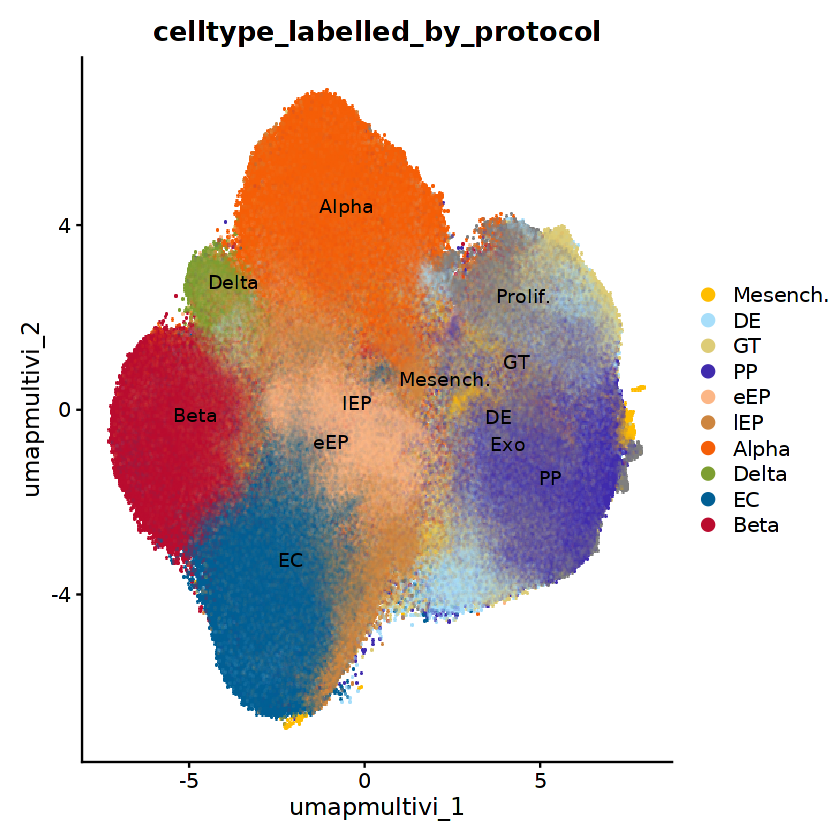

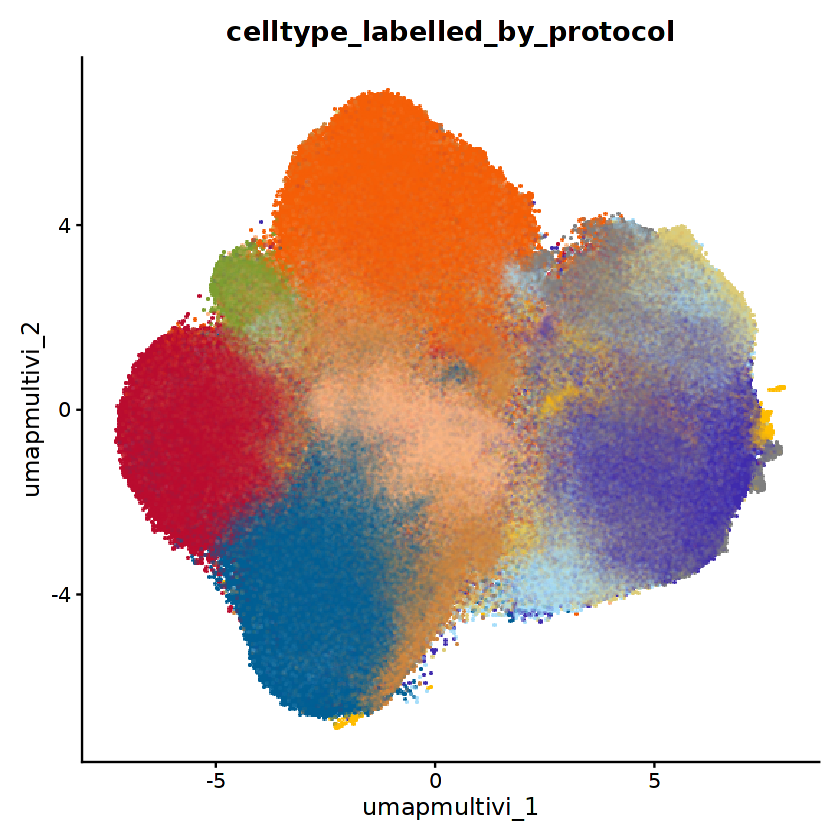

In [5]:
DimPlot(i, label = TRUE, repel = TRUE, 
        reduction = "umap.multivi",group.by = 'celltype_labelled_by_protocol', cols=pal,pt.size = 2) 

DimPlot(i, label = FALSE,  repel = TRUE, 
        reduction = "umap.multivi",group.by = 'celltype_labelled_by_protocol', cols=pal,pt.size = 2)  + theme(legend.position = "none")


In [6]:
#Pairwise Subsetting
Alpha_subset_1 <- subset(i, subset = celltype_labelled_by_protocol %in% c('PP','eEP','lEP','Alpha'))
#Subsetting
Alpha_subset_1 <- subset(Alpha_subset_1, subset = modality %in% c('paired','expression'))
rm(i)

In [ ]:
DimPlot(Alpha_subset_1, label = TRUE, repel = TRUE, 
        reduction = "umap.multivi",group.by = 'celltype_labelled_by_protocol', cols=pal,pt.size = 2) 

DimPlot(Alpha_subset_1, label = FALSE,  repel = TRUE, 
        reduction = "umap.multivi",group.by = 'celltype_labelled_by_protocol', cols=pal,pt.size = 2)  + theme(legend.position = "none")

In [8]:
# count the frequency of each unique value of 'orig.ident'
table(Alpha_subset_1@meta.data$orig.ident)
table(Alpha_subset_1@meta.data$protocol)
table(Alpha_subset_1@meta.data$day)


     balboa.s5dt   balboa.s7w0a11    balboa.s7w0b3    balboa.s7w0b5 
             581             1304             1327             1061 
  balboa.s7w3d18   balboa.s7w3d20   balboa.s7w3d25 balboa.s7w6exp22 
            1635             1070             1806             2077 
balboa.s7w6exp23      balboa.sndt          hua.d26         punn.esc 
            1302              489             2860            12367 
       punn.ipsc        punn.sci1        punn.sci2        punn.sci3 
            2322             3118             2853             3062 
      punn.sciw3       punn.sciw4             s2d1             s3d1 
            2128             1814              216               73 
            s4d2             s5d1             s5d3             s5d5 
            3711             5257             4954             5058 
            s6d1            s6d14             s6d7       veres.s3x1 
            3219             2844             2861              979 
      veres.s3x2       veres.s4x1


    Balboa        Hua Millman.v3    Rezania   Veres.x1   Veres.x2       Weng 
     12652       2860      55857       3339      12440      11351       2052 
       Zhu 
     45752 


 Day3  Day4  Day5  Day6  Day7  Day8  Day9 Day10 Day11 Day13 Day14 Day15 Day16 
    9     9   216    45    73  1756   637  3711  9348 15300  6435  4954  1070 
Day17 Day18 Day20 Day21 Day24 Day25 Day26 Day31 Day32 Day33 Day34 Day39 Day41 
 6984  5325  3219  6624  4145  6667  5721  1538 13085  2844 22258 12498  2128 
Day45 Day48 Day66 
 4511  1814  3379 

In [9]:
#Pairwise Subsetting
Alpha_subset_2 <- subset(Alpha_subset_1, subset = day %in% c('Day9', 'Day10', 'Day11', 'Day13', 'Day14', 
                                                                 'Day15','Day16 ','Day17', 'Day18', 'Day20','Day21',
                                                                 'Day24','Day25','Day26'))

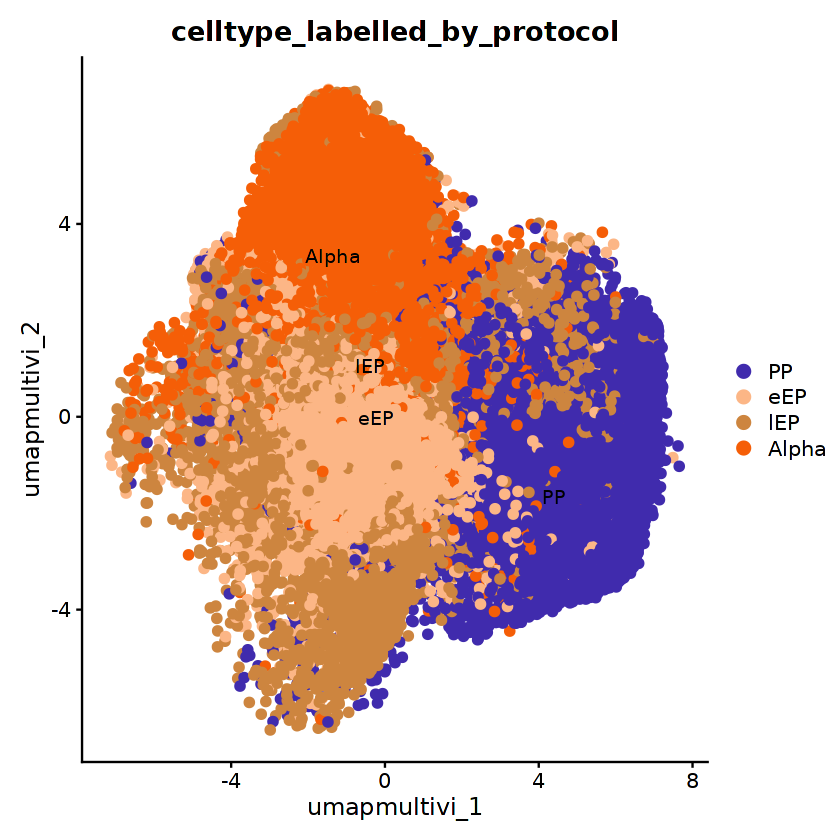

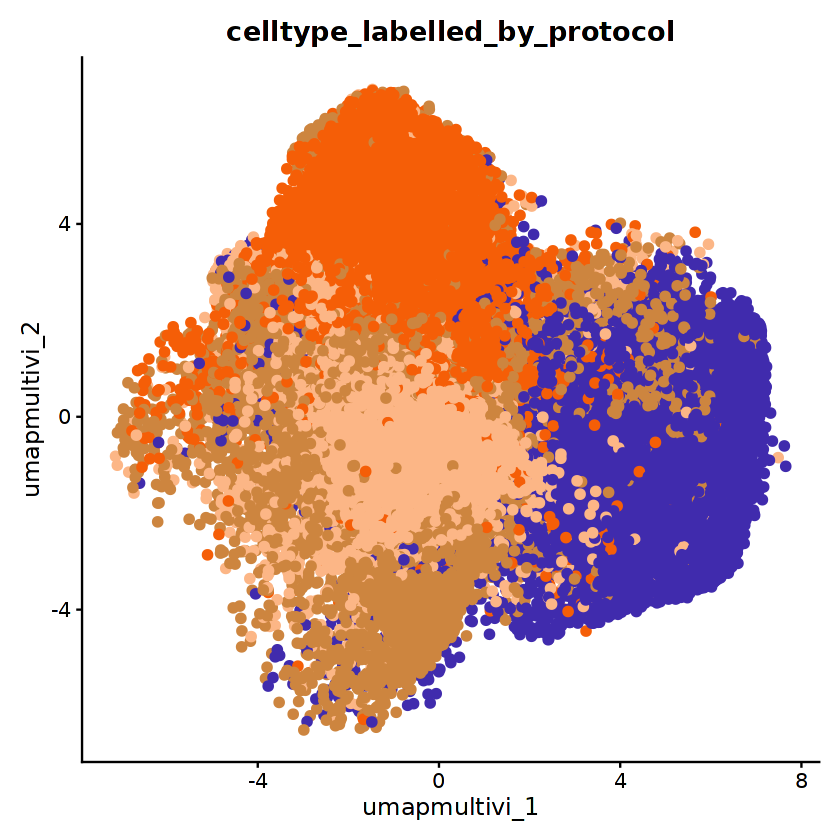

In [10]:
DimPlot(Alpha_subset_2, label = TRUE, repel = TRUE, 
        reduction = "umap.multivi",group.by = 'celltype_labelled_by_protocol', cols=pal,pt.size = 2) 

DimPlot(Alpha_subset_2, label = FALSE,  repel = TRUE, 
        reduction = "umap.multivi",group.by = 'celltype_labelled_by_protocol', cols=pal,pt.size = 2)  + theme(legend.position = "none")

In [11]:
table(Alpha_subset_2@meta.data$orig.ident)



     balboa.s5dt   balboa.s7w0a11    balboa.s7w0b3    balboa.s7w0b5 
               0             1304             1327             1061 
  balboa.s7w3d18   balboa.s7w3d20   balboa.s7w3d25 balboa.s7w6exp22 
               0                0                0                0 
balboa.s7w6exp23      balboa.sndt          hua.d26         punn.esc 
               0                0             2860                0 
       punn.ipsc        punn.sci1        punn.sci2        punn.sci3 
               0                0                0                0 
      punn.sciw3       punn.sciw4             s2d1             s3d1 
               0                0                0                0 
            s4d2             s5d1             s5d3             s5d5 
            3711             5257             4954             5058 
            s6d1            s6d14             s6d7       veres.s3x1 
            3219                0             2861                0 
      veres.s3x2       veres.s4x1

In [12]:
#remove the big object, we don't need it anymore
rm(Alpha_subset_1)


In [16]:
rm(Alpha_Delta_subset_2)

# Process the Alpha_Subset

In [14]:
# ---- Objects to process ----
obj_names <- c("Alpha_subset_2"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })




Processing Alpha_subset_2 ...

Centering and scaling data matrix

PC_ 1 
Positive:  POTEE, ATP5G2, C6orf48, C14orf2, PTP4A1, ID1, ID3, IGF2, FTL, SEPT9 
	   CLU, DLK1, LDHB, HIGD1A, FAM84A, NLRP1, HSPA1A, TUBA1B, PABPC3, ALDH1A1 
	   GSTP1, TMSB4X, TTR, HSPA1B, AGT, TMEM56, PWAR6, CKB, GBAS, LOXL4 
Negative:  CDKAL1, FHIT, ANKS1B, CACNB2, FAM155A, SGCD, AC073050.1, NAV3, PDZRN3, FOXP2 
	   LINGO2, LRP1B, TOX, FAT3, STXBP5L, TMTC2, NPAS3, ULK4, PTPRG, PTPRM 
	   SPAG16, PTPRD, PARD3B, LINC00907, RGS6, DNAH7, GALNT13, BCAS3, ROBO1, ASTN2 
PC_ 2 
Positive:  CACNA1A, PTPRN2, INS, KCNJ6, CRYBA2, SCG5, CACNA1C, ST6GALNAC5, NEGR1, CELF4 
	   NRXN1, HEPACAM2, KCNK17, FGF14, STMN2, KCNK16, GNAO1, SAMD3, ASIC2, CACNA2D1 
	   RYR2, NFASC, LINC01811, NEUROD1, KCNMA1, PLCXD3, HS3ST5, CACNA1B, ACVR1C, ARFGEF3 
Negative:  LYPD6B, FN1, FRAS1, KIAA1217, CDH6, MECOM, TRABD2B, LAMA1, LTBP1, SLC4A4 
	   LYPD6, ONECUT1, CASC15, RARB, TCF7L2, GPC3, C5, NIBAN1, LINC01208, MIR31HG 
	   YAP1, PTPN14, ARHGAP28,

In [ ]:
#PLOT UMAP figures
DefaultAssay(Alpha_subset_2) <- "RNA"

DimPlot(Alpha_subset_2, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'celltype_labelled_by_protocol')   + theme(legend.position = "none")

DimPlot(Alpha_subset_2, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters')   + theme(legend.position = "none")

DimPlot(Alpha_subset_2, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'protocol')   + theme(legend.position = "none")

DimPlot(Alpha_subset_2, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day')  + theme(legend.position = "none")

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(Alpha_subset_2, reduction = 'umap', group.by = 'seurat_clusters', label=T)

DimPlot(Alpha_subset_2, reduction = 'umap', group.by = 'day', label=T) 

# ---- Settings ----
genes <- c(
  'COL1A1','COL3A1',
  'TOP2A','MKI67',
  'SOX17','CER1',
  'GATA6','GATA4',
  'SOX9','PDX1',
  'CFTR','SPINK1',
  'NEUROG3','CHGA',
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG'
)

out_dir <- "outputs/Alpha_subset_2_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(Alpha_subset_2)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      Alpha_subset_2, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


An object of class Seurat 
95325 features across 63868 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

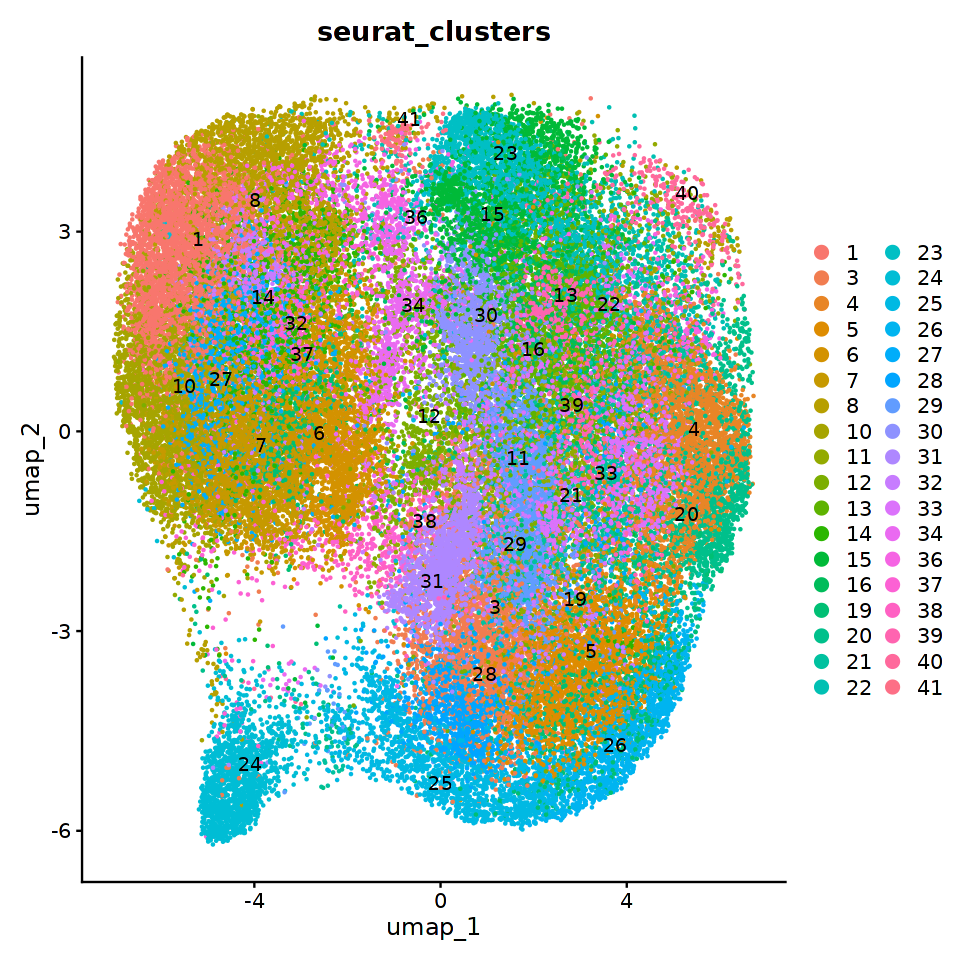

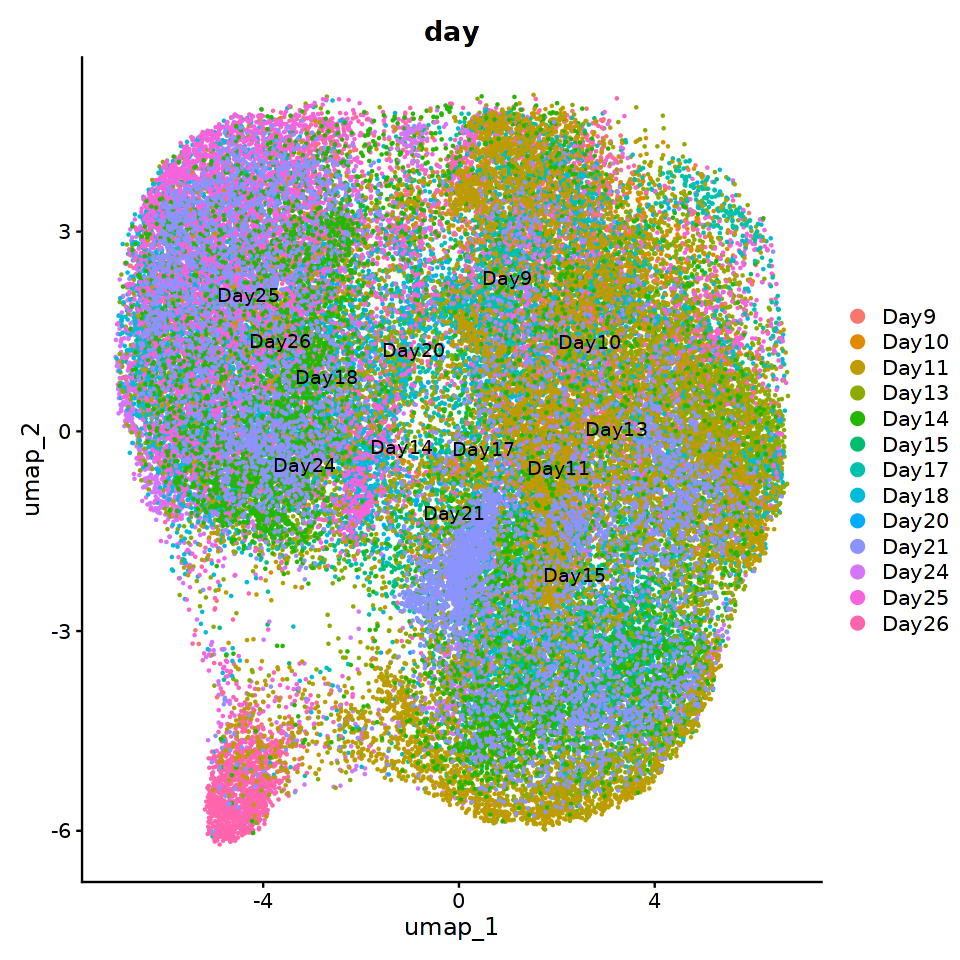

In [18]:
Alpha_subset_3 <- subset(Alpha_subset_2, subset = seurat_clusters %in%  c(       1,        3,   4,   5,   6,   7,   8,     
                                                                           10,  11,  12,  13,  14,  15,  16,            19,
                                                                                21,  22,  23,  24,  25,  26,  27,  28,  29,
                                                                           20,  21,  22,  23,       25,  26,  27,  28,  29,
                                                                           30,  31,  32,  33,  34,       36,  37,  38,  39,
                                                                           40,  41,  42,  43,  44,  45,  46,  47,  48,  49
                                                                                     ))

Alpha_subset_3
DimPlot(Alpha_subset_3, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 
DimPlot(Alpha_subset_3, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day') 

In [19]:
# ---- Objects to process ----
obj_names <- c("Alpha_subset_3"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })




Processing Alpha_subset_3 ...

Centering and scaling data matrix

PC_ 1 
Positive:  CDKAL1, FHIT, FAM155A, ANKS1B, FAT3, PARD3B, PTPRG, PDZRN3, CACNB2, LINGO2 
	   AC073050.1, ZFPM2, BCAS3, FOXP2, TOX, SGCD, DNAH7, CBLB, LRP1B, NAV3 
	   ADGRL3, ROBO1, PTPRM, NLGN1, MACROD2, AC109466.1, ULK4, CNTNAP2, RGS6, FBXL7 
Negative:  POTEE, ATP5G2, C6orf48, C14orf2, PTP4A1, ID1, FTL, CLU, SEPT9, ID3 
	   IGF2, HIGD1A, HSPA1A, ALDH1A1, TTR, NLRP1, FAM84A, HSPA1B, AGT, RNASEK 
	   TMSB4X, TUBA1B, PABPC3, LDHB, STMN1, DLK1, LOXL4, TMEM56, PWAR6, GSTP1 
PC_ 2 
Positive:  CACNA1A, PTPRN2, INS, KCNJ6, CACNA1C, CRYBA2, SCG5, ST6GALNAC5, NRXN1, NEGR1 
	   KCNK17, ASIC2, CACNA2D1, KCNK16, FGF14, CELF4, SAMD3, RYR2, GNAO1, KCNMA1 
	   LINC01811, HS3ST5, PLCXD3, CACNA1B, ARFGEF3, NOL4, ERO1B, RGS9, STMN2, ST18 
Negative:  LYPD6B, FN1, FRAS1, KIAA1217, MECOM, LAMA1, CDH6, LTBP1, TRABD2B, LYPD6 
	   ONECUT1, SLC4A4, RARB, TCF7L2, GPC3, HMGA2, NIBAN1, YAP1, C5, ARHGAP28 
	   LINC01208, SNTB1, CASC15, BMPR1B,

In [ ]:
#PLOT UMAP figures
DefaultAssay(Alpha_subset_3) <- "RNA"

DimPlot(Alpha_subset_3, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'celltype_labelled_by_protocol')   + theme(legend.position = "none")

DimPlot(Alpha_subset_3, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters')   + theme(legend.position = "none")

DimPlot(Alpha_subset_3, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'protocol')   + theme(legend.position = "none")

DimPlot(Alpha_subset_3, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day')  + theme(legend.position = "none")

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(Alpha_subset_3, reduction = 'umap', group.by = 'seurat_clusters', label=T)

DimPlot(Alpha_subset_3, reduction = 'umap', group.by = 'day', label=T) 

# ---- Settings ----
genes <- c(
  'TOP2A','MKI67',
  'SOX17',
  'SOX9','PDX1',
  'NEUROG3','CHGA',
  'SLC18A1','TPH1', 'LMX1A','DDC','FEV',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG'
)

out_dir <- "outputs/Alpha_subset_3_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(Alpha_subset_3)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      Alpha_subset_3, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


An object of class Seurat 
95325 features across 46953 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

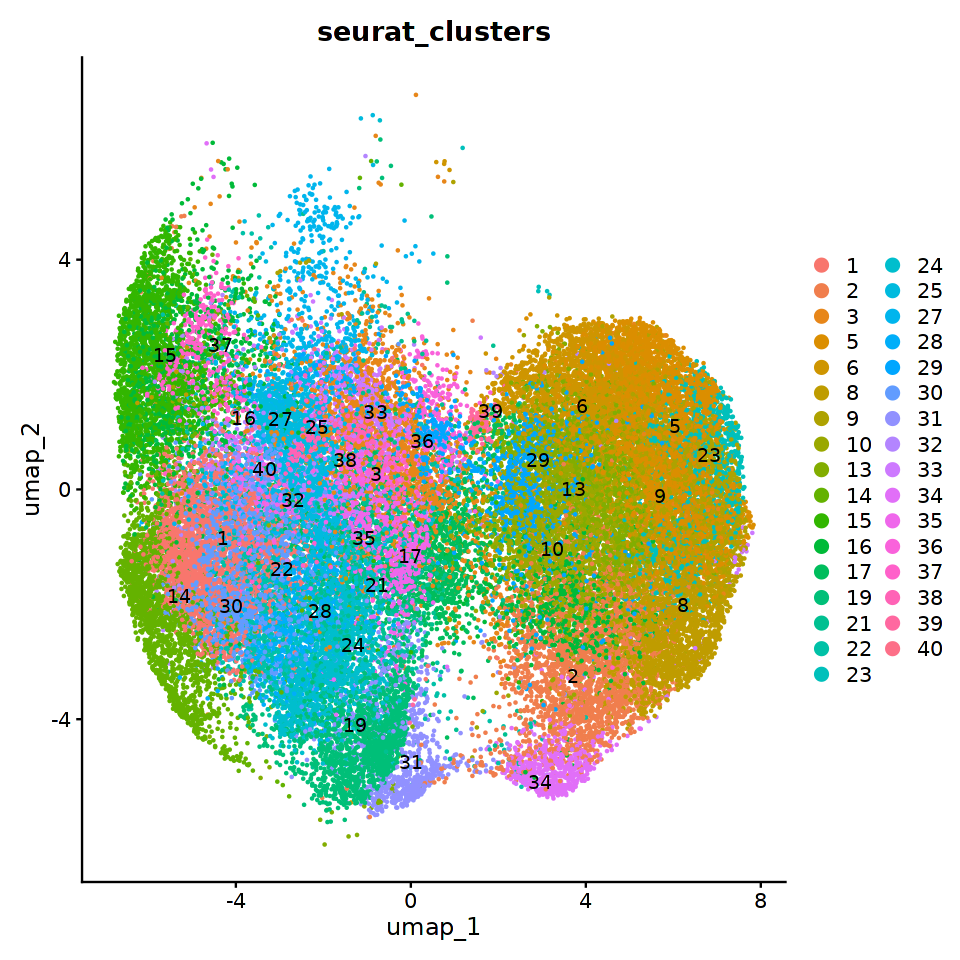

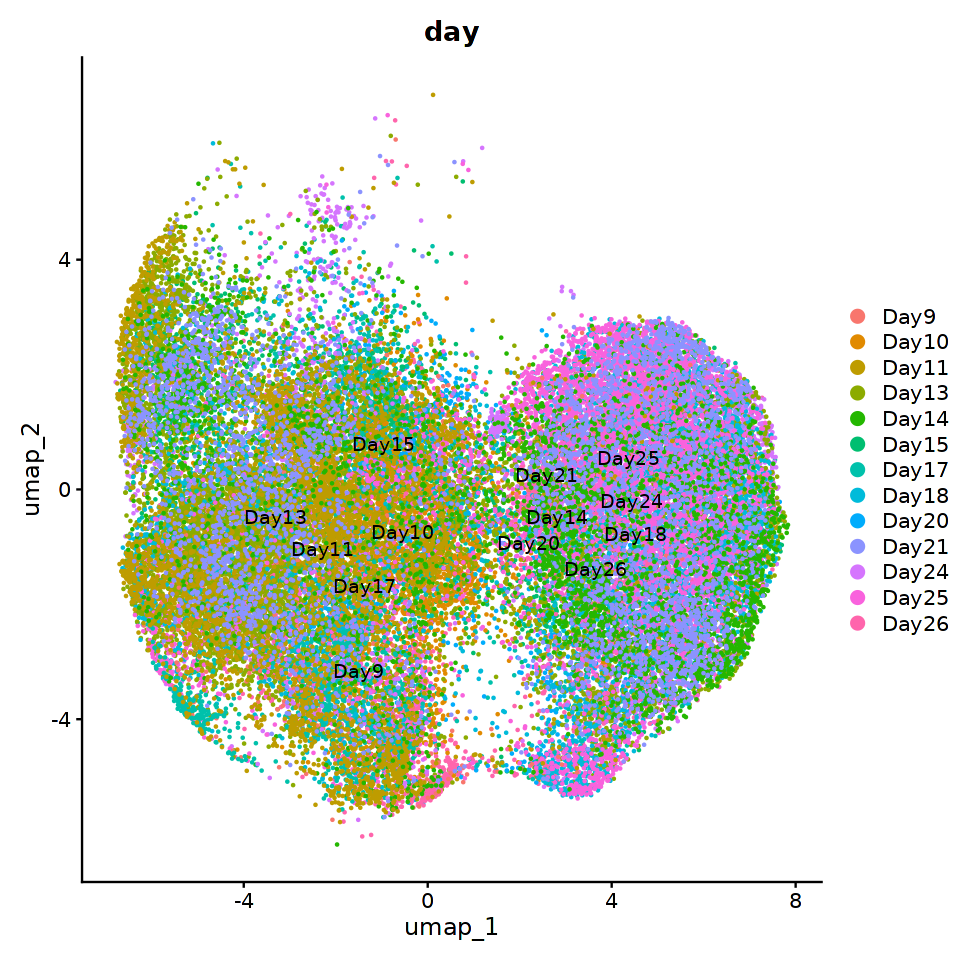

In [28]:
Alpha_subset_4 <- subset(Alpha_subset_3, subset = seurat_clusters %in%  c(       1,   2,   3,        5,   6,        8,   9,
                                                                           10,            13,  14,  15,  16,  17,       19,
                                                                                21,  22,  23,  24,  25,       27,  28,  29,
                                                                           30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
                                                                           40 
                                                                              ))


Alpha_subset_4
DimPlot(Alpha_subset_4, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 
DimPlot(Alpha_subset_4, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day') 

In [29]:
# ---- Objects to process ----
obj_names <- c("Alpha_subset_4"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })




Processing Alpha_subset_4 ...

Centering and scaling data matrix

PC_ 1 
Positive:  CDKAL1, FHIT, AC073050.1, HECW2, PTPRG, ANKS1B, LINGO2, FAT3, ROBO1, CACNB2 
	   FSTL5, FAM155A, BCAS3, ZFPM2, PTPRM, STXBP5L, CBLB, PTPRD, ADGRL3, TOX 
	   FOXP2, PDZRN3, AC109466.1, FRY, LRP1B, EPHA6, ROBO2, LSAMP, SPAG16, NLGN1 
Negative:  POTEE, ATP5G2, C6orf48, PTP4A1, ID1, IGF2, CLU, ID3, FTL, HSPA1A 
	   HIGD1A, ALDH1A1, FAM84A, NLRP1, AGT, HSPA1B, RNASEK, PABPC3, STMN1, TUBA1B 
	   LOXL4, LDHB, TTR, TMEM56, PWAR6, TMSB4X, CKB, GSTP1, DLK1, C10orf10 
PC_ 2 
Positive:  FN1, LYPD6B, FRAS1, KIAA1217, MECOM, TRABD2B, LAMA1, CDH6, LTBP1, ONECUT1 
	   TCF7L2, LYPD6, SLC4A4, HMGA2, GPC3, CASC15, ARHGAP28, RARB, FLRT2, NIBAN1 
	   C5, SERINC5, NR5A2, NRG3, YAP1, PRTG, CUX2, LHFPL3-AS2, CDK14, ANGPT2 
Negative:  PTPRN2, CACNA1A, INS, SCG5, ST6GALNAC5, RIMBP2, KCNJ6, CACNA1C, ARFGEF3, CRYBA2 
	   NRXN1, KCNB2, ERO1B, KCNK16, KCNMA1, CELF4, SAMD3, HS3ST5, BTBD11, NEGR1 
	   KCNK17, ACVR1C, HEPACAM2, PDZD2, 

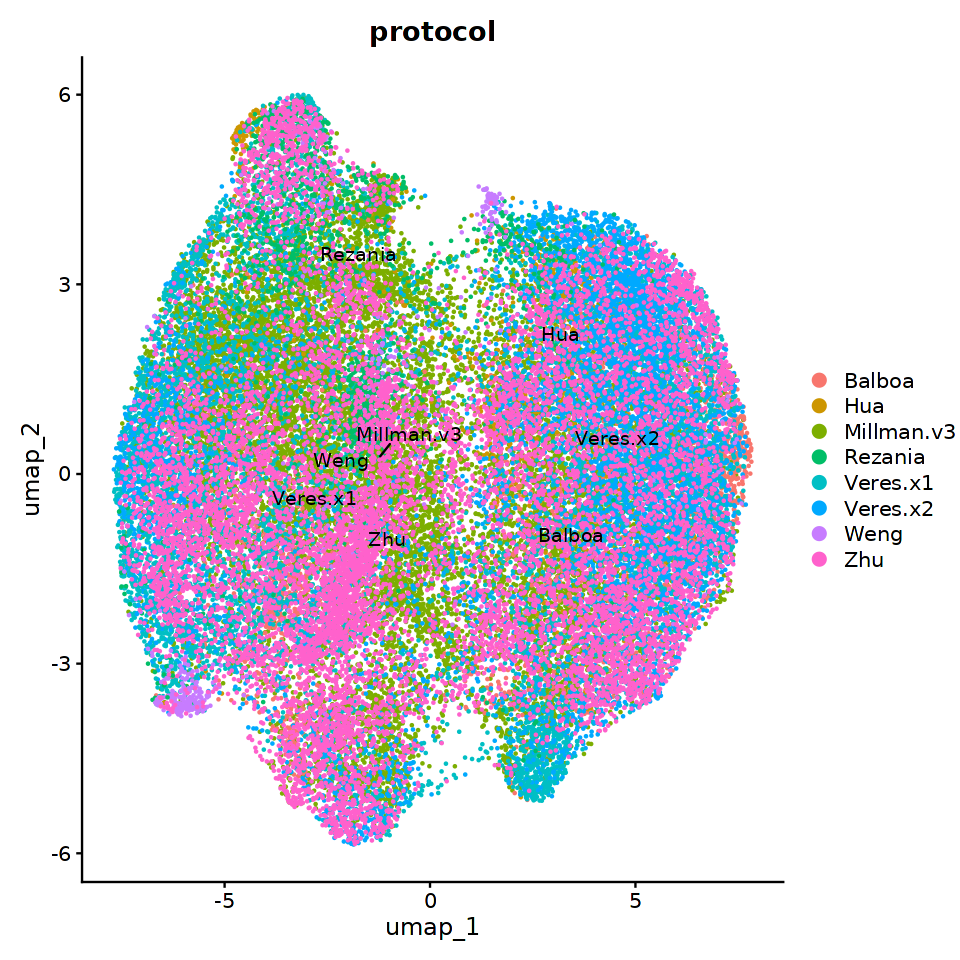

In [30]:

DimPlot(Alpha_subset_4, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'protocol')   

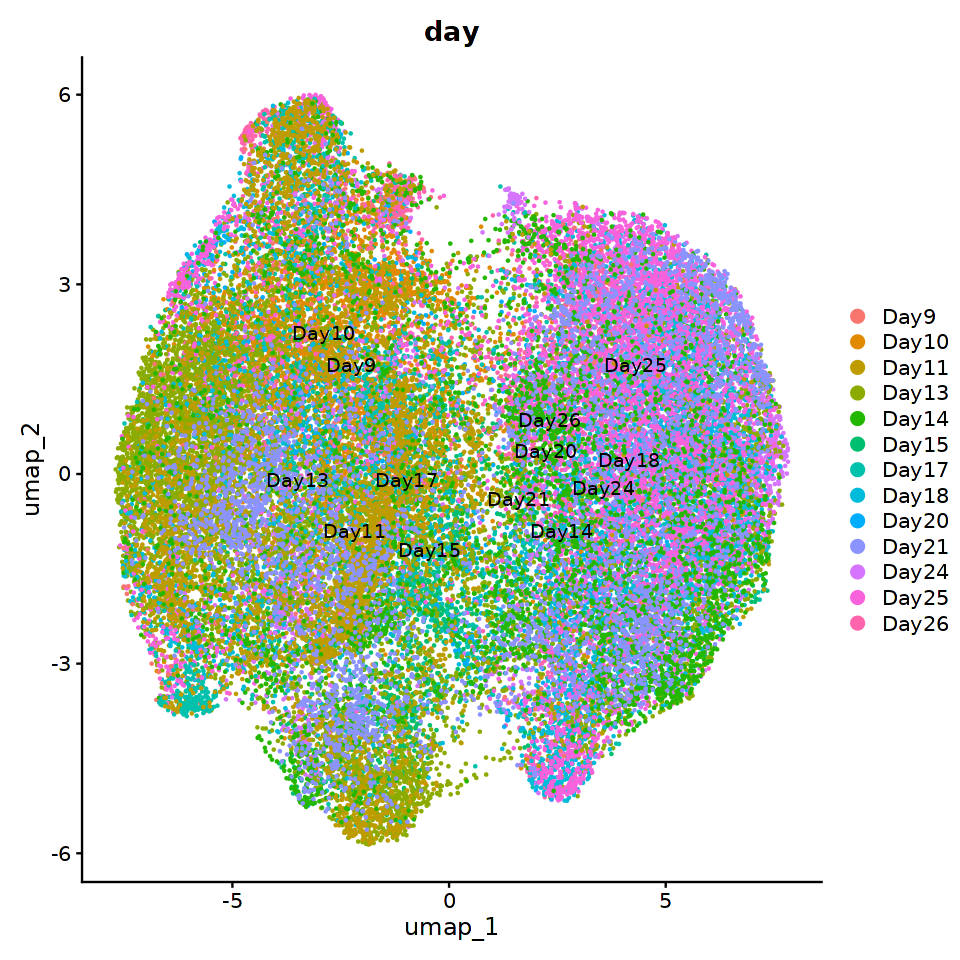

In [31]:

DimPlot(Alpha_subset_4, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day')   

In [ ]:
#PLOT UMAP figures
DefaultAssay(Alpha_subset_4) <- "RNA"

DimPlot(Alpha_subset_4, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'celltype_labelled_by_protocol')   + theme(legend.position = "none")

DimPlot(Alpha_subset_4, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters')   + theme(legend.position = "none")

DimPlot(Alpha_subset_4, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'protocol')   + theme(legend.position = "none")

DimPlot(Alpha_subset_4, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day')  + theme(legend.position = "none")

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(Alpha_subset_4, reduction = 'umap', group.by = 'seurat_clusters', label=T)

DimPlot(Alpha_subset_4, reduction = 'umap', group.by = 'day', label=T) 

# ---- Settings ----
genes <- c(
  'TOP2A','MKI67',
  'SOX17',
  'SOX9','PDX1',
  'NEUROG3','CHGA',
  'SLC18A1','TPH1', 'LMX1A','DDC','FEV',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG'
)

out_dir <- "outputs/Alpha_subset_4_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(Alpha_subset_3)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      Alpha_subset_4, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


In [34]:
cell_count <- table(Alpha_subset_4@meta.data$day)
cell_count


 Day3  Day4  Day5  Day6  Day7  Day8  Day9 Day10 Day11 Day13 Day14 Day15 Day16 
    0     0     0     0     0     0   305  2821  4185  9572  3667  2183     0 
Day17 Day18 Day20 Day21 Day24 Day25 Day26 Day31 Day32 Day33 Day34 Day39 Day41 
 3397  3736  2172  3856  2870  5070  3119     0     0     0     0     0     0 
Day45 Day48 Day66 
    0     0     0 

An object of class Seurat 
95325 features across 35822 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

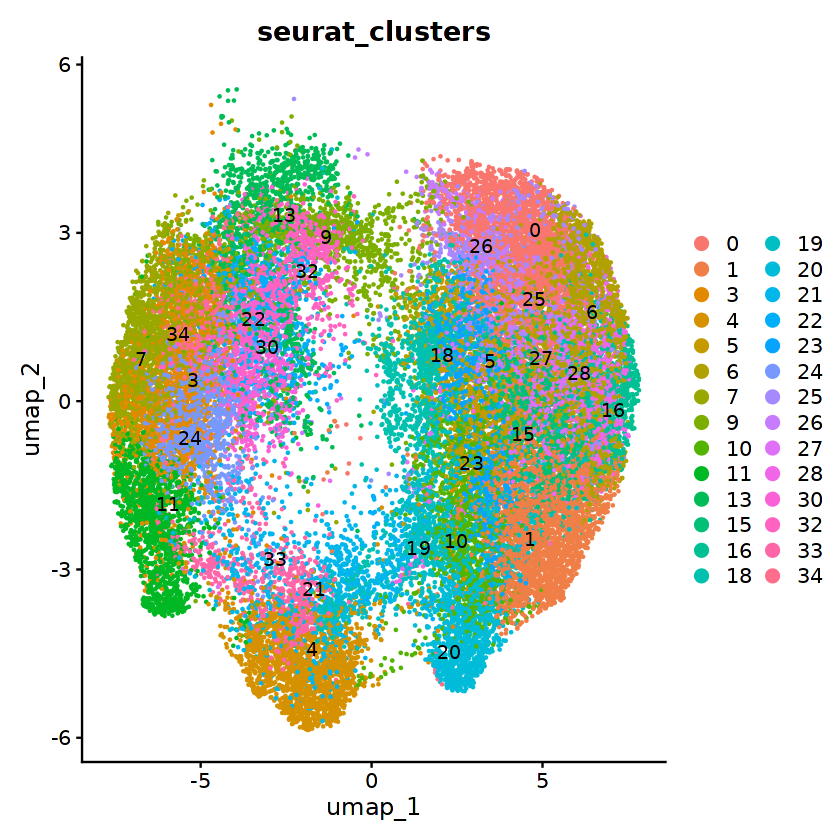

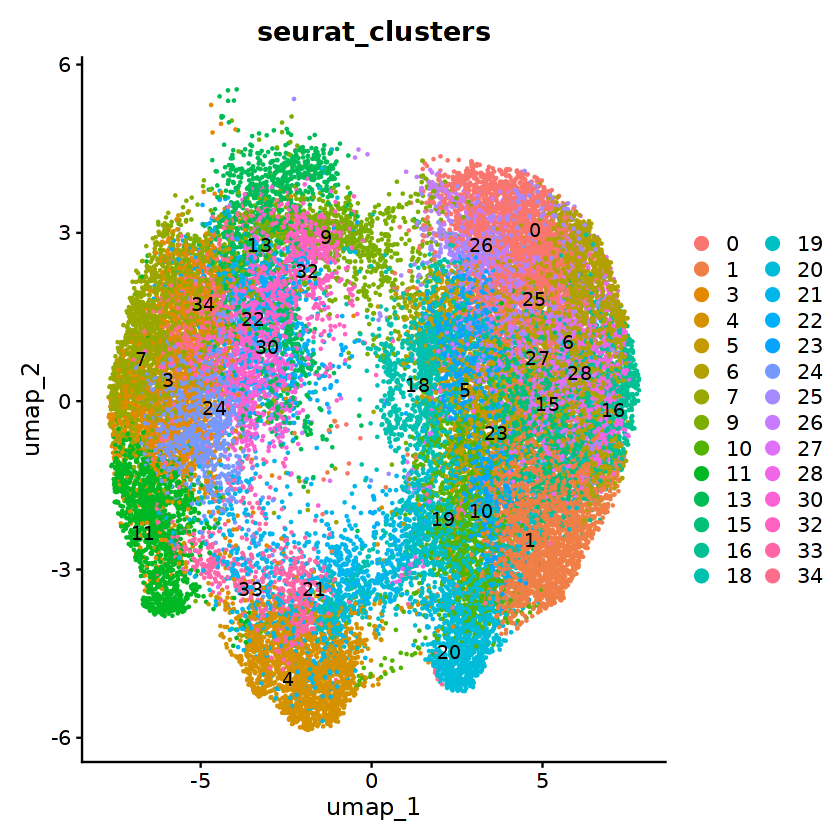

In [46]:
Alpha_subset_5 <- subset(Alpha_subset_4, subset = seurat_clusters %in%  c( 0,   1,        3,   4,   5,   6,   7,        9,
                                                                           10,  11,       13,       15,  16,       18,  19,
                                                                           20,  21,  22,  23,  24,  25,  26,  27,  28,   
                                                                           30,       32,  33,  34                         
                                                                              ))
Alpha_subset_5 <- subset(Alpha_subset_5, subset = day %in%  c('Day10', 'Day11', 'Day13', 'Day14', 'Day15', 'Day17',
                                                                          'Day18', 'Day20', 'Day21', 'Day24', 'Day25', 'Day26'
                                                                              ))
Alpha_subset_5
options(repr.plot.width = 7, repr.plot.height = 7)
DimPlot(Alpha_subset_5, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 
DimPlot(Alpha_subset_5, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 

In [47]:
cell_count <- table(Alpha_subset_5@meta.data$protocol)
cell_count


    Balboa        Hua Millman.v3    Rezania   Veres.x1   Veres.x2       Weng 
      2121        965      10798        373       6007       6987        349 
       Zhu 
      8222 

In [48]:
Alpha_subset_5

An object of class Seurat 
95325 features across 35822 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

In [49]:
# ---- Objects to process ----
obj_names <- c('Alpha_subset_5')

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })




Processing Alpha_subset_5 ...

Centering and scaling data matrix

PC_ 1 
Positive:  POTEE, ATP5G2, C6orf48, PTP4A1, CLU, CD63, HSPA1A, ALDH1A1, ID1, IGF2 
	   AGT, NLRP1, HIGD1A, HSPA1B, LOXL4, FAM84A, TTR, ID3, TMEM56, FTL 
	   PWAR6, SST, PABPC3, DLK1, C10orf10, LDHB, GLUL, SERPINI1, DNAJB1, GSTP1 
Negative:  CDKAL1, PLCL1, FHIT, AC073050.1, PRICKLE2, CACNB2, FMNL2, PARD3B, LINGO2, CCDC144NL-AS1 
	   ANKS1B, IMMP2L, HECW2, FSTL5, PTPRG, ROBO1, MACROD2, STXBP5L, SPAG16, PTPRM 
	   PTPRD, BCAS3, FAT3, ZFPM2, FOXP2, KCNQ1OT1, ROBO2, KCNB2, EXT1, FRY 
PC_ 2 
Positive:  INS, CACNA1A, PTPRN2, CRYBA2, ST6GALNAC5, CACNA1C, KCNB2, ERO1B, KCNJ6, BTBD11 
	   NRXN1, HS3ST5, SAMD3, KCNMA1, TMOD1, PDE4D, PDZD2, HS6ST3, KCNK16, CELF4 
	   SLC7A8, SLC30A8, ACVR1C, ABCC8, CDH18, ZDHHC14, KCNK17, NEGR1, SLC35F3, GNAO1 
Negative:  FN1, LYPD6B, FRAS1, TRABD2B, MECOM, KIAA1217, LTBP1, CASC15, CDH6, TCF7L2 
	   C5, LAMA1, RARB, SLC4A4, MIR31HG, FLRT2, LYPD6, GPC3, COL4A5, UNC13C 
	   LINC01208, ONECUT1, P

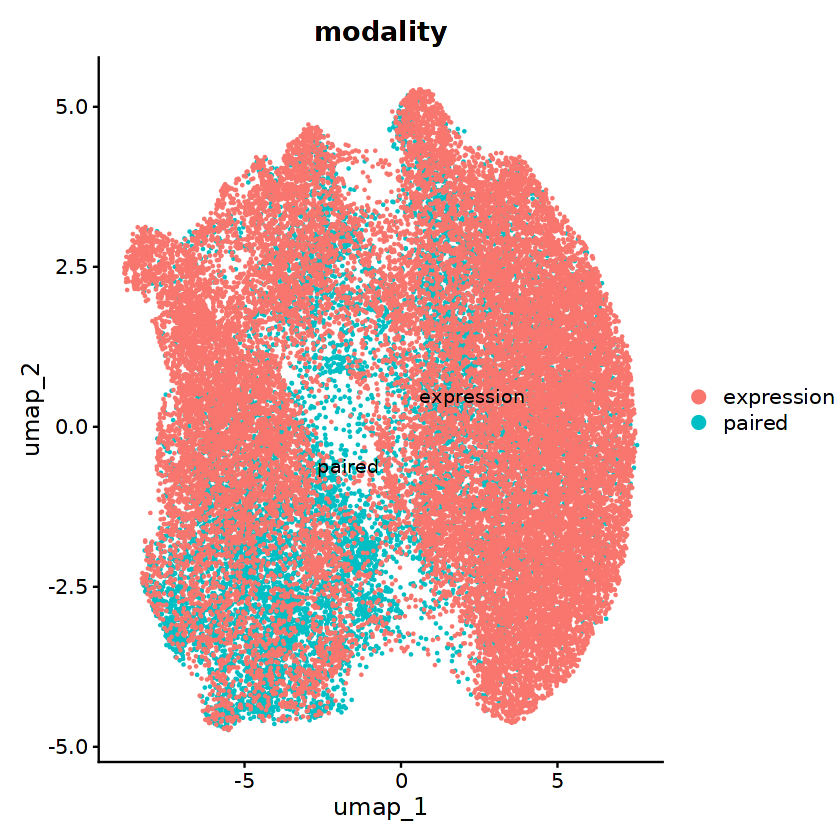

In [50]:
DimPlot(Alpha_subset_5, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'modality')

In [ ]:
#PLOT UMAP figures
DefaultAssay(Alpha_subset_5) <- "RNA"

DimPlot(Alpha_subset_5, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'celltype_labelled_by_protocol') 

DimPlot(Alpha_subset_5, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters')

DimPlot(Alpha_subset_5, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'protocol')  

DimPlot(Alpha_subset_5, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day') 

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(Alpha_subset_5, reduction = 'umap', group.by = 'seurat_clusters', label=T)

DimPlot(Alpha_subset_5, reduction = 'umap', group.by = 'day', label=T) 

# ---- Settings ----
genes <- c(
  'TOP2A','MKI67',
  'SOX17',
  'SOX9','PDX1',
  'NEUROG3','CHGA',
  'SLC18A1','TPH1', 'LMX1A','DDC','FEV',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG'
)

out_dir <- "outputs/Alpha_subset_5_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(Alpha_subset_3)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      Alpha_subset_5, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


In [53]:
table(Alpha_subset_5@meta.data$protocol)
Alpha_subset_5



    Balboa        Hua Millman.v3    Rezania   Veres.x1   Veres.x2       Weng 
      2121        965      10798        373       6007       6987        349 
       Zhu 
      8222 

An object of class Seurat 
95325 features across 35822 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

In [54]:
table(Alpha_subset_5@meta.data$day)



 Day3  Day4  Day5  Day6  Day7  Day8  Day9 Day10 Day11 Day13 Day14 Day15 Day16 
    0     0     0     0     0     0     0  2192  2098  7605  3048  1401     0 
Day17 Day18 Day20 Day21 Day24 Day25 Day26 Day31 Day32 Day33 Day34 Day39 Day41 
 1975  3237  1690  3385  2235  4422  2534     0     0     0     0     0     0 
Day45 Day48 Day66 
    0     0     0 

In [55]:
Alpha_subset_5

An object of class Seurat 
95325 features across 35822 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

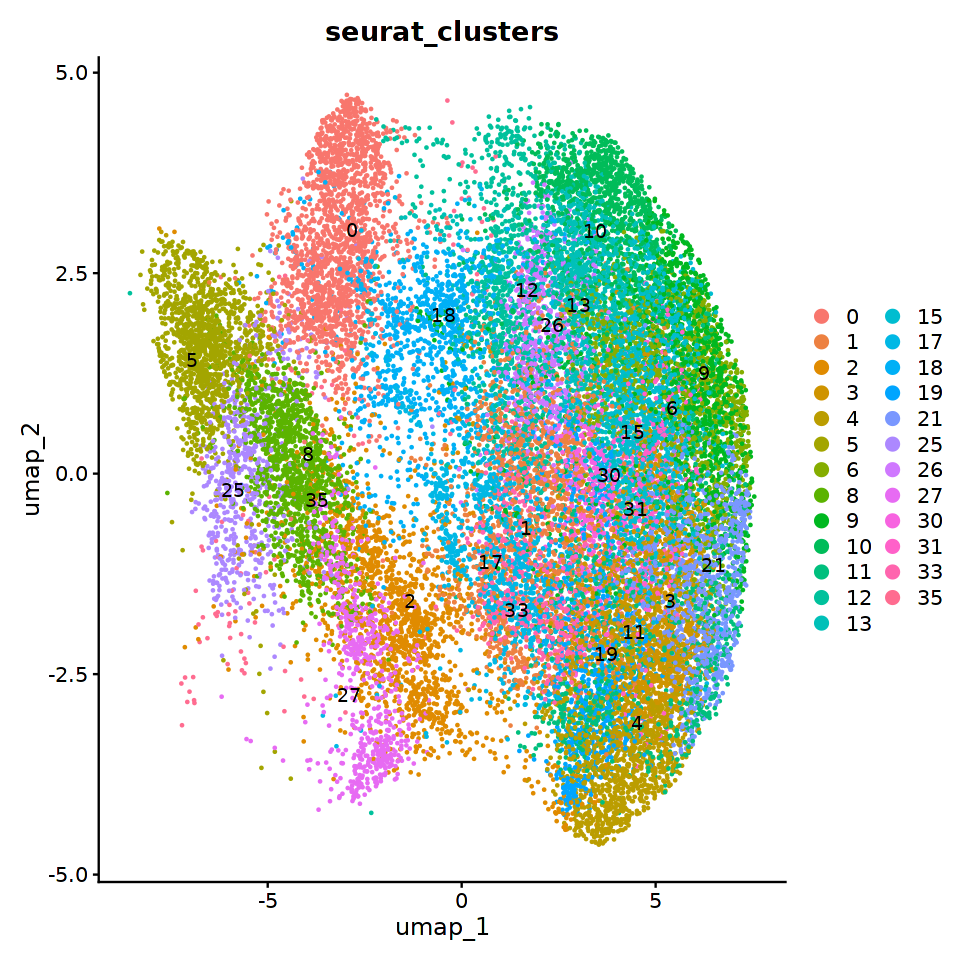

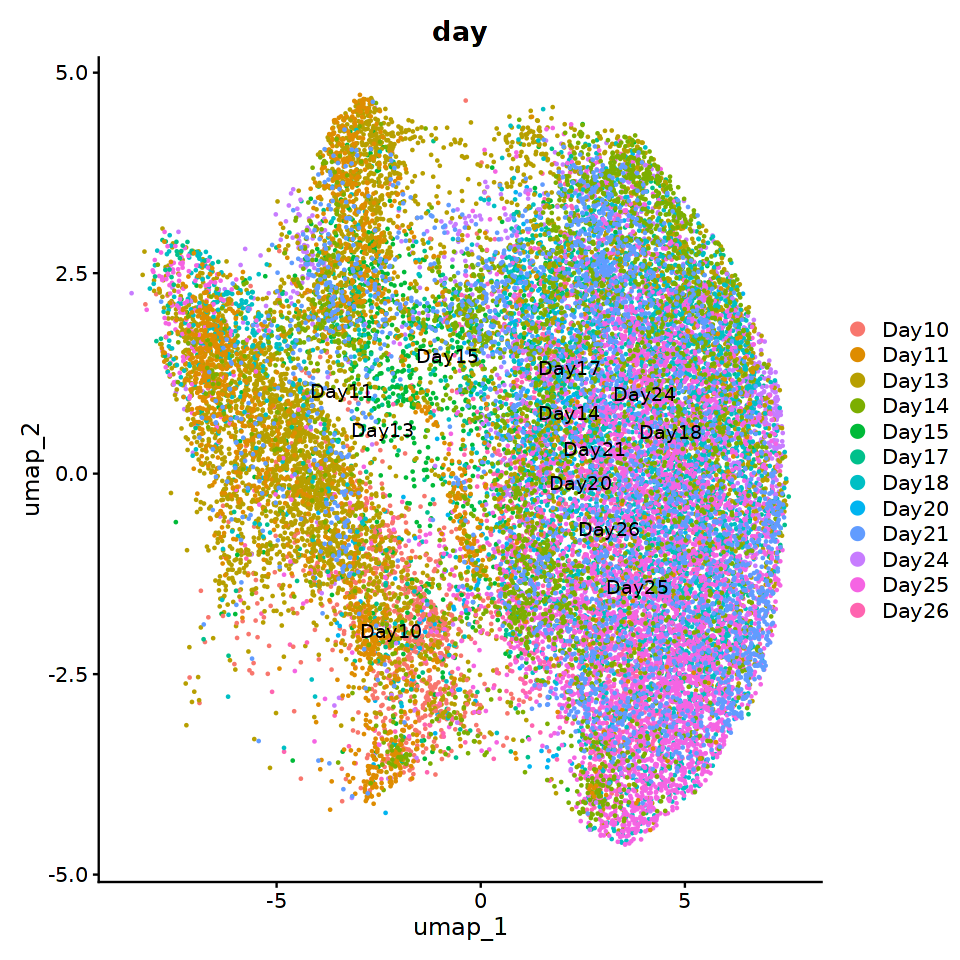

In [59]:
Alpha_subset_6 <- subset(Alpha_subset_5, subset = seurat_clusters %in%  c( 0,   1,   2,   3,   4,   5,   6,        8,   9,
                                                                           10,  11,  12,  13,       15,       17,  18,  19,
                                                                                21,                 25,  26,  27,          
                                                                           30,  31,       33,       35
                                                                              ))


DimPlot(Alpha_subset_6, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 
DimPlot(Alpha_subset_6, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day') 

In [63]:
# ---- Objects to process ----
obj_names <- c("Alpha_subset_6")

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 5,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })




Processing Alpha_subset_6 ...

Centering and scaling data matrix

PC_ 1 
Positive:  KCNH7, DPP10, CACNB2, AC073050.1, CDKAL1, FHIT, AC104041.1, PLCL1, KIAA1211, RGS7 
	   FMNL2, NPAS3, LINGO2, NAV3, FSTL5, PRICKLE2, MAPK10, LINC01876, SPAG16, PARD3B 
	   HECW2, MAGI2, FOXP2, ANKS1B, PTPRD, AL049828.1, KCNQ1OT1, CCDC144NL-AS1, STXBP5L, AL033504.1 
Negative:  POTEE, ATP5G2, C6orf48, PTP4A1, CLU, HSPA1A, AGT, LOXL4, HSPA1B, NLRP1 
	   ID1, IGF2, TTR, TMEM56, FAM84A, SST, PWAR6, SERPINI1, C10orf10, ID3 
	   PABPC3, GLUL, DLK1, FAM46C, DNAJB1, SLC14A1, LDHB, CDKN1C, DUSP1, HSPB1 
PC_ 2 
Positive:  FN1, FRAS1, LYPD6B, TRABD2B, MECOM, CASC15, KIAA1217, FLRT2, LTBP1, SLC4A4 
	   ONECUT1, CDH6, TCF7L2, LAMA1, MIR31HG, C5, ARHGAP28, NR5A2, GPC3, LINC01208 
	   PRTG, LYPD6, UNC13C, VCAN, COL4A5, NRG3, RARB, CUX2, ANTXR1, AGTR1 
Negative:  INS, CRYBA2, CACNA1A, TMOD1, ERO1B, PDE4D, HS6ST3, SLC30A8, KCNMA1, SLC7A8 
	   ABCC8, ACVR1C, BTBD11, SLC35F3, TTR, ASPH, ST6GALNAC5, HS3ST5, SAMD3, ZDHHC14 
	

In [ ]:
#PLOT UMAP figures
DefaultAssay(Alpha_subset_6) <- "RNA"

DimPlot(Alpha_subset_6, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'celltype_labelled_by_protocol')   + theme(legend.position = "none")

DimPlot(Alpha_subset_6, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters')   + theme(legend.position = "none")

DimPlot(Alpha_subset_6, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'protocol')   + theme(legend.position = "none")

DimPlot(Alpha_subset_6, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day')  + theme(legend.position = "none")

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(Alpha_subset_6, reduction = 'umap', group.by = 'seurat_clusters', label=T)

DimPlot(Alpha_subset_6, reduction = 'umap', group.by = 'day', label=T) 

# ---- Settings ----
genes <- c(
  'TOP2A','MKI67',
  'SOX17',
  'SOX9','PDX1',
  'NEUROG3','CHGA',
  'SLC18A1','TPH1', 'LMX1A','DDC','FEV',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG'
)

out_dir <- "outputs/Alpha_subset_6_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(Alpha_subset_6)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      Alpha_subset_6, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


In [72]:
table(Alpha_subset_7@meta.data$day)


 Day3  Day4  Day5  Day6  Day7  Day8  Day9 Day10 Day11 Day13 Day14 Day15 Day16 
    0     0     0     0     0     0     0   802   863  4410  2542   834     0 
Day17 Day18 Day20 Day21 Day24 Day25 Day26 Day31 Day32 Day33 Day34 Day39 Day41 
 1163  2667  1245  2279  1866  3982  2033     0     0     0     0     0     0 
Day45 Day48 Day66 
    0     0     0 

In [83]:
table(Alpha_subset_7@meta.data$protocol)


    Balboa        Hua Millman.v3    Rezania   Veres.x1   Veres.x2       Weng 
         0          0       5084        163       2299       3504         66 
       Zhu 
      5492 

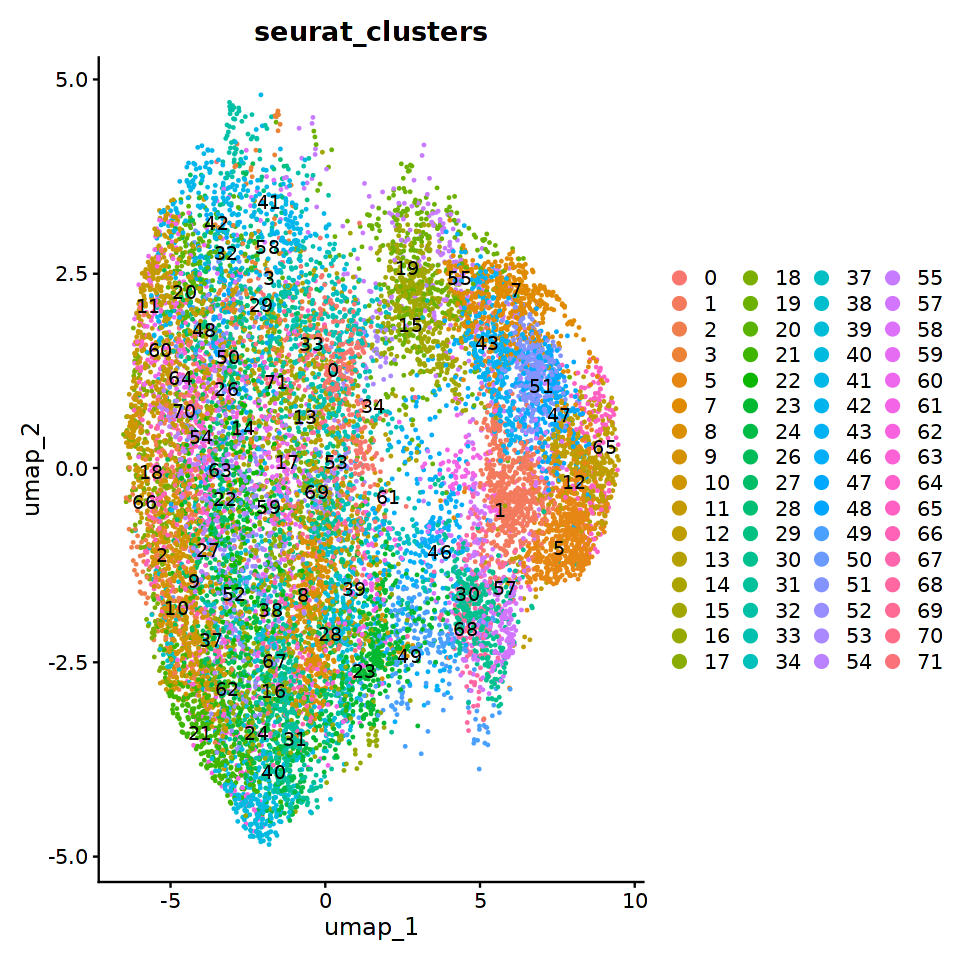

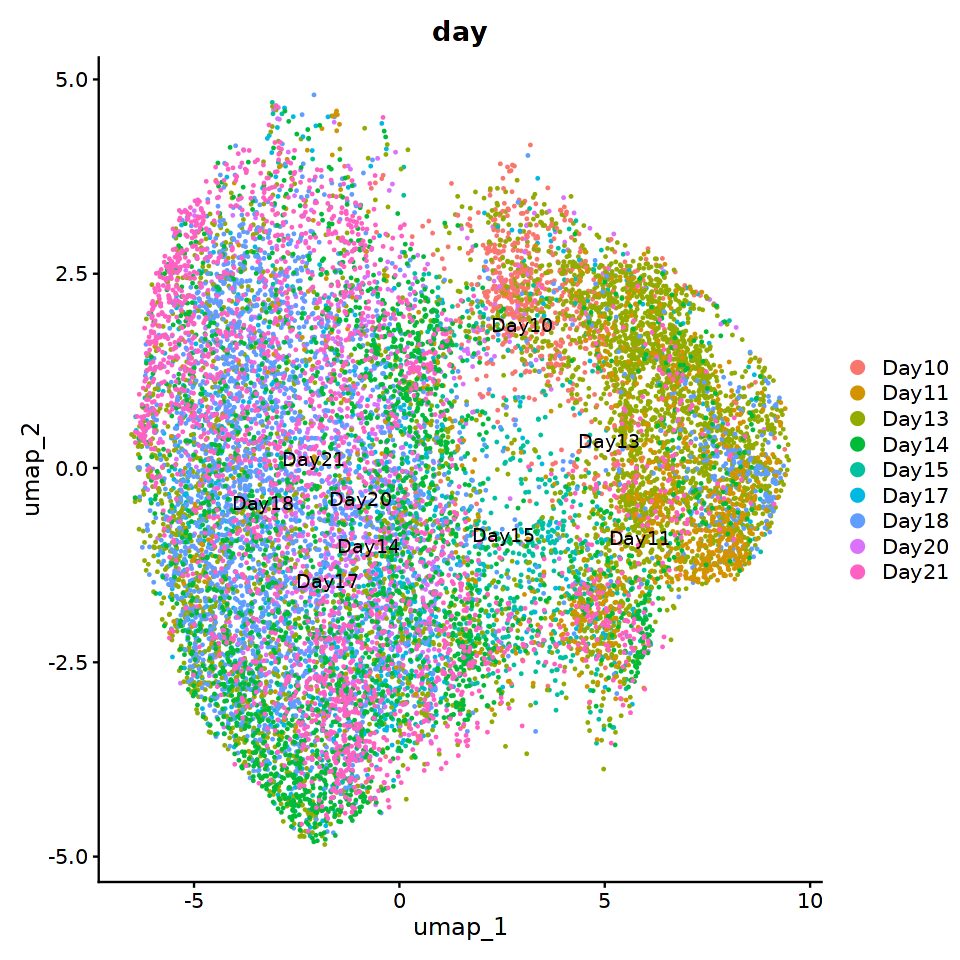

In [100]:
Alpha_subset_7 <- subset(Alpha_subset_6, subset = seurat_clusters %in%  c( 0,   1,   2,   3,        5,         7,   8,   9,
                                                                           10,  11,  12,  13,  14,  15,  16,  17,  18,  19,
                                                                           20,  21,  22,  23,  24,       26,  27,  28,  29,
                                                                           30,  31,  32,  33,  34,            37,  38,  39,
                                                                           40,  41,  42,  43,            46,  47,  48,  49,
                                                                           50,  51,  52,  53,  54,  55,       57,  58,  59,
                                                                           60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
                                                                           70,  71
                                                                                     ))

Alpha_subset_7 <- subset(Alpha_subset_7, subset = day %in%  c('Day10', 'Day11', 'Day13', 'Day14', 'Day15', 'Day17',
                                                                          'Day18', 'Day20', 'Day21'
                                                                              ))

Alpha_subset_7 <- subset(Alpha_subset_7, subset = protocol %in%  c('Millman.v3','Veres.x1','Veres.x2', 'Zhu'
                                                                              ))
DimPlot(Alpha_subset_7, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 
DimPlot(Alpha_subset_7, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day') 

In [101]:
# ---- Objects to process ----
obj_names <- c("Alpha_subset_7")

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })




Processing Alpha_subset_7 ...

Centering and scaling data matrix

PC_ 1 
Positive:  POTEE, ATP5G2, C6orf48, DLK1, LDHB, IGF2, PTP4A1, FAM84A, SEPT9, NLRP1 
	   HSPA1A, HSPA1B, PABPC3, GSTP1, CLU, CLDN6, ID1, PWAR6, HES1, SPINK1 
	   ZFP36L1, MUT, ID3, TMEM56, GFRA3, RN7SKP22, GBAS, SOX9, GATM, HSPB1 
Negative:  CACNB2, AC073050.1, MAGI2, DPP10, NPAS3, ST6GALNAC5, CACNA1A, CACNA1C, ADARB2, PTPRD 
	   CDH18, SPAG16, RGS7, PDZD2, FAM135B, PDE4D, CHST9, GALNT13, NAV3, ASIC2 
	   FHIT, PLCB1, SIPA1L3, SAMD3, TMEM132D, ANKS1B, CACNA2D1, NLGN4Y, TMTC2, NOL4 
PC_ 2 
Positive:  INS, TTR, ACVR1C, TMOD1, PTPRN, SLC30A8, ABCC8, SLC7A8, CRYBA2, NEUROD1 
	   CACNA1A, ERO1B, CELF4, SYT7, KCTD12, RGS4, ZDHHC14, C12orf75, PLPPR5, HS3ST5 
	   ADCY2, TMED8, KCNK16, BTBD11, PCSK2, ASPH, TENT5A, LPAR1, CAPN2, KCNMA1 
Negative:  CASC15, TRABD2B, FRAS1, LYPD6B, MECOM, FN1, FLRT2, KIAA1217, MIR31HG, LTBP1 
	   C5, SLC4A4, TCF7L2, ONECUT1, EDIL3, NRG3, UNC13C, LINC01208, TTC6, COL4A5 
	   CDH6, FNDC3B, NR5A2, 

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(Alpha_subset_7, reduction = 'umap', group.by = 'seurat_clusters', label=T)

DimPlot(Alpha_subset_7, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(Alpha_subset_7, reduction = 'umap', group.by = 'protocol', label=T) 

# ---- Settings ----
genes <- c(
  'TOP2A','MKI67',
  'SOX17',
  'SOX9','PDX1',
  'NEUROG3','CHGA',
  'SLC18A1','TPH1', 'LMX1A','DDC','FEV',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG'
)

out_dir <- "outputs/Alpha_subset_7_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(Alpha_subset_7)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      Alpha_subset_7, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


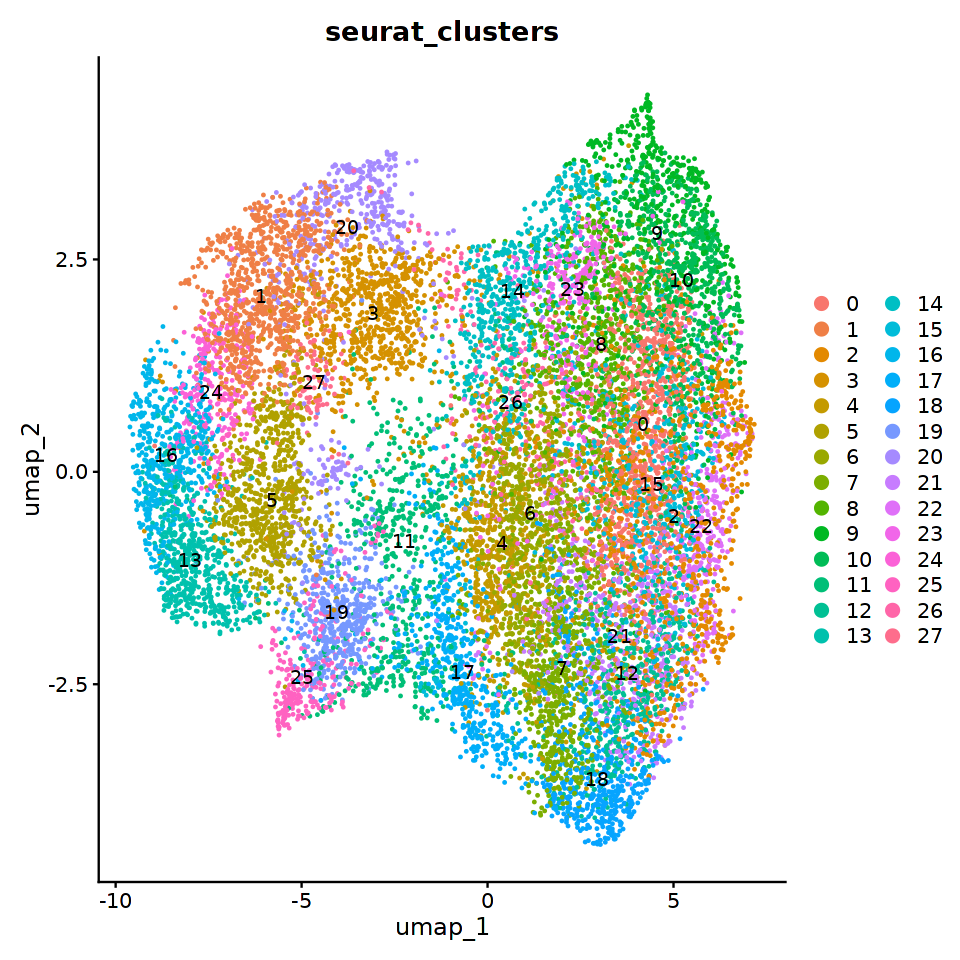

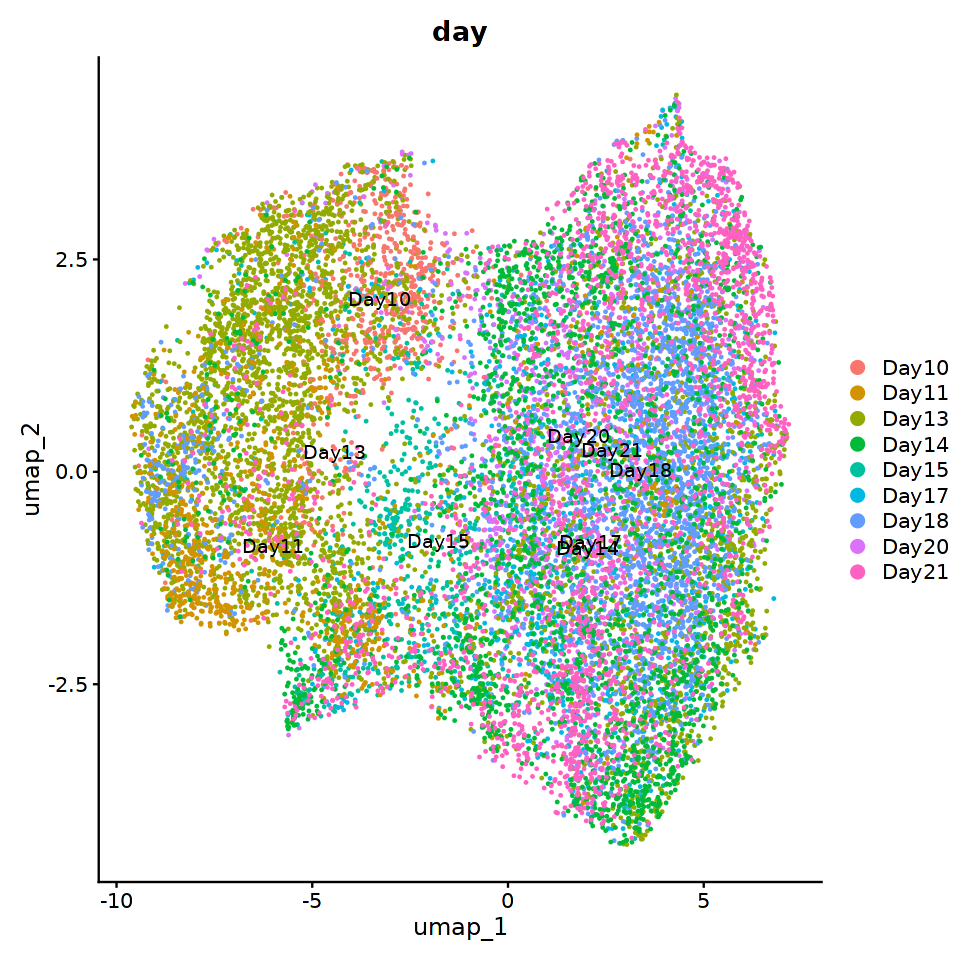

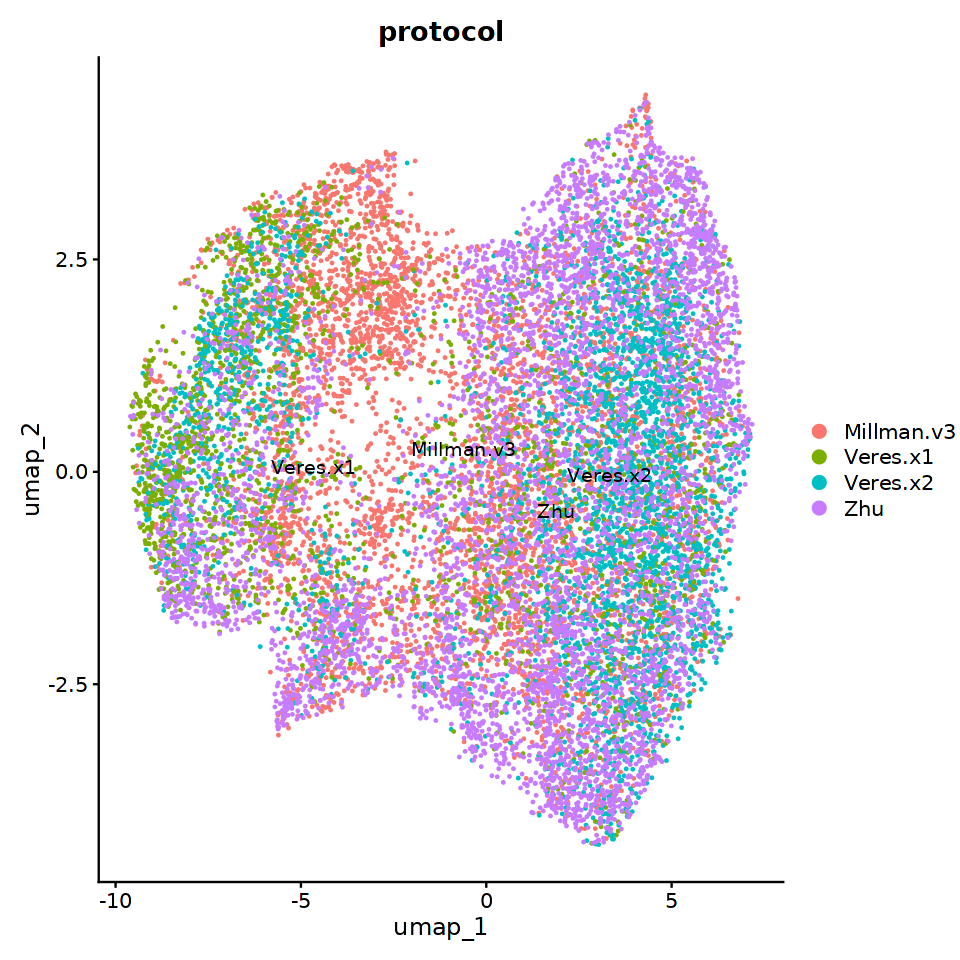

In [103]:
DimPlot(Alpha_subset_7, reduction = 'umap', group.by = 'seurat_clusters', label=T)

DimPlot(Alpha_subset_7, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(Alpha_subset_7, reduction = 'umap', group.by = 'protocol', label=T) 


In [104]:
Alpha_subset_7

An object of class Seurat 
95325 features across 16122 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

In [105]:
saveRDS(Alpha_subset_7, file="checkpoints/DT_muon_Alpha_subset.rds")

# Labelling DT_muon_Alpha_subset

In [3]:
Alpha_subset <- readRDS("checkpoints/DT_muon_Alpha_subset.rds")
Alpha_subset

In [ ]:
Alpha_subset <- FindClusters(
    Alpha_subset,
    graph.name   = 'RNA_snn',
    resolution   = 3,
    random.seed  = 777,
    verbose      = FALSE
  )

Alpha_subset

In [ ]:
DimPlot(
  Alpha_subset,
  reduction = "umap",
  group.by  = "seurat_clusters",
  label     = TRUE,
    pt.size = 1.8 )

In [ ]:
DimPlot(Alpha_subset, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'celltype_labelled_by_protocol')   + theme(legend.position = "none")

In [ ]:
DimPlot(Alpha_subset, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day')   

In [ ]:
# Asignar los clusters A y B según 'orig.ident'
Alpha_subset@meta.data$celltype_Alpha_subset <- "Z"
Alpha_subset@meta.data$celltype_Alpha_subset[Alpha_subset@meta.data$seurat_clusters %in% c(1,2,3,5,6,7,21,26,38)] <- 'PP'
Alpha_subset@meta.data$celltype_Alpha_subset[Alpha_subset@meta.data$seurat_clusters %in% c(8,10,30)] <- 'EP'
Alpha_subset@meta.data$celltype_Alpha_subset[Alpha_subset@meta.data$seurat_clusters %in% c(28,34)] <- 'eAlpha_1'
Alpha_subset@meta.data$celltype_Alpha_subset[Alpha_subset@meta.data$seurat_clusters %in% c(14,4,16,17,37)] <- 'eAlpha_2'
Alpha_subset@meta.data$celltype_Alpha_subset[Alpha_subset@meta.data$seurat_clusters %in% c(18,15,13,31,27,0,20,36,24,19,32,33,
                                                                                           23,35,25,22,12,29,11,39,9)] <- 'Alpha'


options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(Alpha_subset, reduction = 'umap', group.by = 'celltype_Alpha_subset', pt.size = 1.5,label=T) +NoLegend()

In [ ]:
table(Alpha_subset@meta.data$orig.ident)
table(Alpha_subset@meta.data$protocol)
table(Alpha_subset@meta.data$day)

In [ ]:
saveRDS(Alpha_subset,"checkpoints/DT_muon_Alpha_subset.rds")

# Pseudotime

In [3]:
Alpha_subset <- readRDS("checkpoints/DT_muon_Alpha_subset.rds")

In [4]:
Alpha_subset

An object of class Seurat 
95325 features across 16122 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

In [5]:
pal_protocol <- c(
        "Weng" = "#F763DF",  # Magenta
        "Veres.x2"       = "#00a7ff", # cyan blue
        "Veres.x1"       = "#00C0B4", # aquamarine
        "Rezania"       = "#00B813", # green
        "Zhu"       = "#bc9d00", # Sand green
        "Millman.v3" = "#F8766D", # salmon,
        'Hua' = '#E68613', # Orange
        'Balboa' = '#C77CFF' #violet
         )

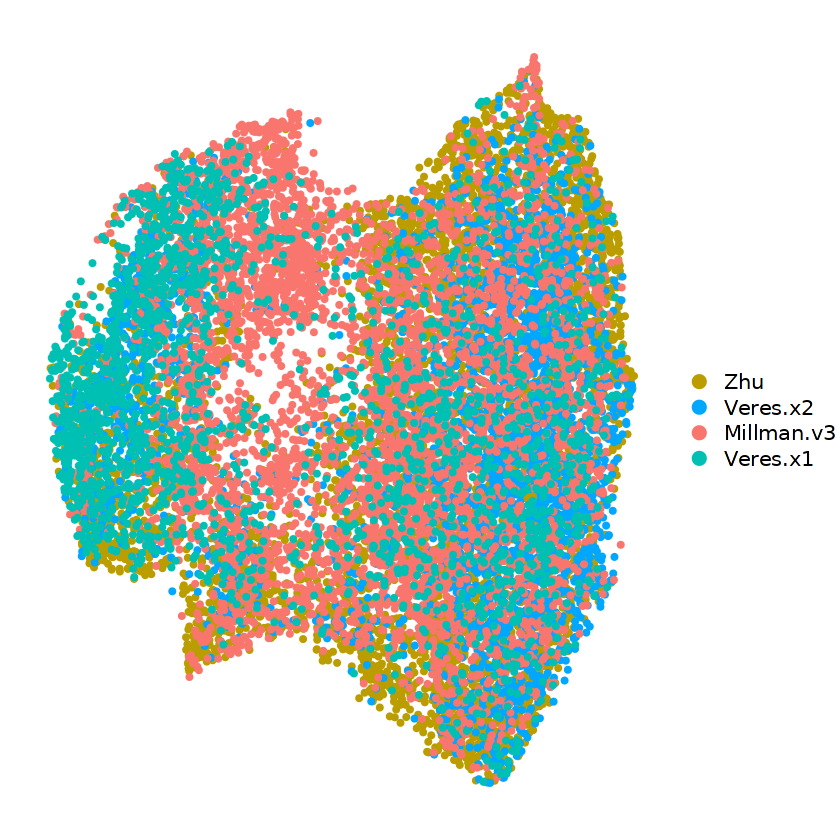

In [8]:
p <- DimPlot(
  Alpha_subset,
  reduction = "umap",
  group.by  = "protocol",
  label     = FALSE,
    pt.size = 1,
    cols = pal_protocol,
    order     = c('Veres.x1',"Millman.v3",'Veres.x2',"Zhu")

) +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. S20C

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_Alpha/umap_DT_Alpha_protocol_legend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)

In [ ]:
p <- DimPlot(
  Alpha_subset,
  reduction = "umap",
  group.by  = "protocol",
  label     = FALSE,
    pt.size = 1.8,
    cols = pal_protocol,
    order     = c('Veres.x1',"Millman.v3",'Veres.x2',"Zhu")

) +
  NoLegend() +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. S20C

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_Alpha/umap_DT_Alpha_protocol_nolegend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)

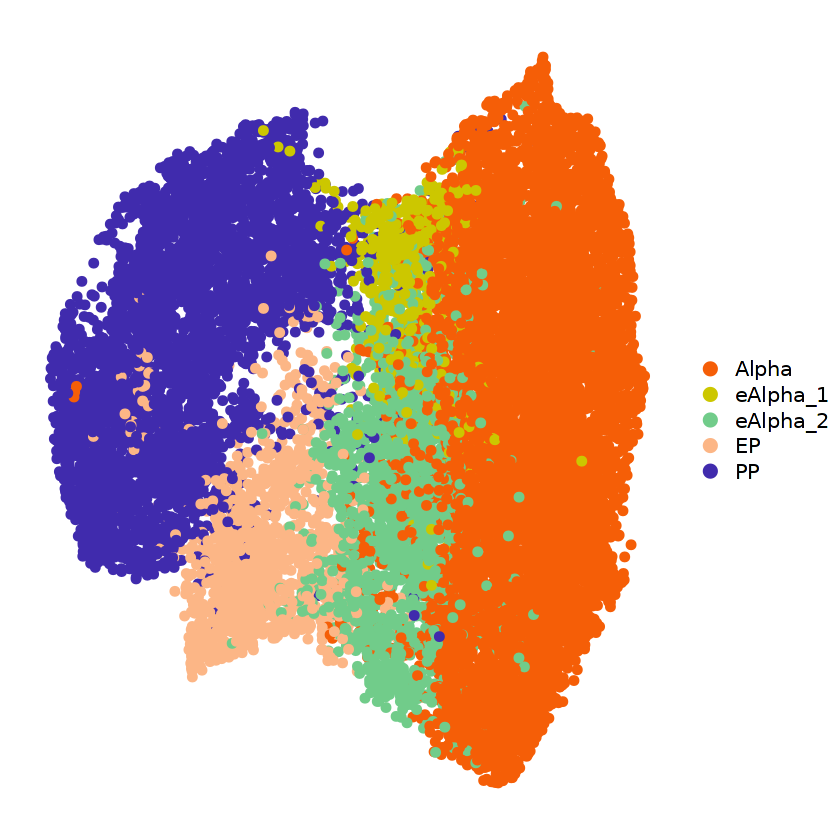

In [10]:
pal <- c(
        "Mesench." = "#ffbd00",  # yellow
        "UE"       = "#EE3377", # magenta / raspberry
        "DE"       = "#a7defa", # light sky blue
        "GT"       = "#DDCC77", # warm sand / golden khaki
        "PP"       = "#402bad", # deep indigo
        "Exocrine" = "#117733", # forest green
        "EP"      = "#fcb686", # crema
        "lEP"       = '#cd853f', #Peru color
        "Alpha"    = "#f55e07", # vivid orange
        "eAlpha_1"    = "#CCC700", #  
        "eAlpha_2"    = "#71CC8A", #  
        "Delta"    = "#7d9e31", # olive
        "EC"       = "#015f94", # royal blue
        "Beta"     = "#ba0c2f", # WashU red
        "Beta-EC"     = "#b867bf" # purple
      )

p <- DimPlot(
  Alpha_subset,
  reduction = "umap",
  group.by  = "celltype_Alpha_subset",
  label     = FALSE,
    pt.size = 1.8 ,

  cols      = pal
) +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. S20A

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_Alpha/umap_DT_Alpha_legend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)


In [ ]:
pal <- c(
        "Mesench." = "#ffbd00",  # yellow
        "UE"       = "#EE3377", # magenta / raspberry
        "DE"       = "#a7defa", # light sky blue
        "GT"       = "#DDCC77", # warm sand / golden khaki
        "PP"       = "#402bad", # deep indigo
        "Exocrine" = "#117733", # forest green
        "EP"      = "#fcb686", # crema
        "lEP"       = '#cd853f', #Peru color
        "Alpha"    = "#f55e07", # vivid orange
        "eAlpha_1"    = "#CCC700", #  
        "eAlpha_2"    = "#71CC8A", #  
        "Delta"    = "#7d9e31", # olive
        "EC"       = "#015f94", # royal blue
        "Beta"     = "#ba0c2f", # WashU red
        "Beta-EC"     = "#b867bf" # purple
      )

p <- DimPlot(
  Alpha_subset,
  reduction = "umap",
  group.by  = "celltype_Alpha_subset",
  label     = FALSE,
    pt.size = 1.8 ,

  cols      = pal
) +
  NoLegend() +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. S20A

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_Alpha/umap_DT_Alpha_nolegend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)


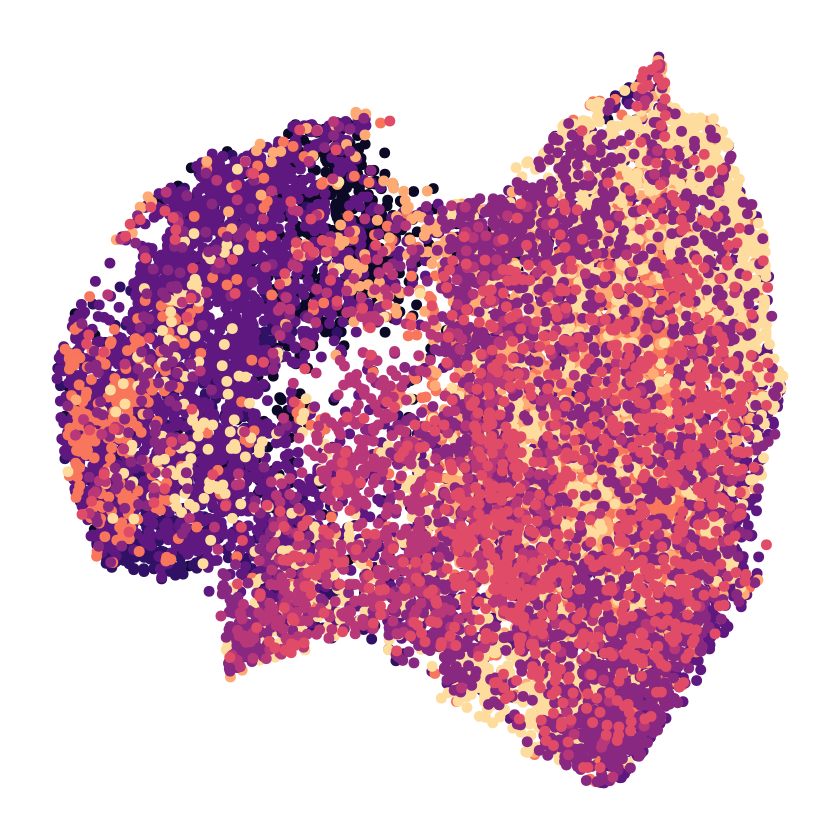

In [12]:
magma_29 <- c(
  '#000004',
  '#040414',
  '#0C0926',
  '#160F3B',
  '#221150',
  '#311165',
  '#400F74',
  '#51127C',
  '#5F187F',
  '#6D1D81',
  '#7B2382',
  '#892881',
  '#982D80',
  '#A6317D',
  '#B73779',
  '#C53C74',
  '#D3436E',
  '#E04C67',
  '#EB5760',
  '#F3655C',
  '#F8765C',
  '#FC8961',
  '#FD9A6A',
  '#FEAA74',
  '#FEBB81',
  '#FECC8F',
  '#FDDC9E',
  '#FCECAE',
  '#FCFDBF'
)


pal_days <- c(
  "Day10" = magma_29[3],
  "Day11" = magma_29[6],
  "Day13" = magma_29[9],
  "Day14" = magma_29[12],
  "Day15" = magma_29[15],
  "Day17" = magma_29[18],
  "Day18" = magma_29[21],
  "Day20" = magma_29[24],
  "Day21" = magma_29[27]
  )


#BuYlRd_Ed <- c('#D53E4F','#F46D43','#FDAE61', '#fcd462', '#f0f0a8','#ABD9E9','#74ADD1','#4575B4','#5e4fa2')

p <- DimPlot(
  Alpha_subset,
  reduction = "umap",
  group.by  = "day",
  label     = FALSE,
    pt.size = 1.8 ,   
  order     = c("Day17","Day15","Day14","Day21", "Day20","Day18",  "Day13","Day11","Day10"),
  cols      = pal_days
) +
  NoAxes() +
  NoLegend() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. S20B

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_Alpha/umap_DT_Alpha_day_nolegend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)


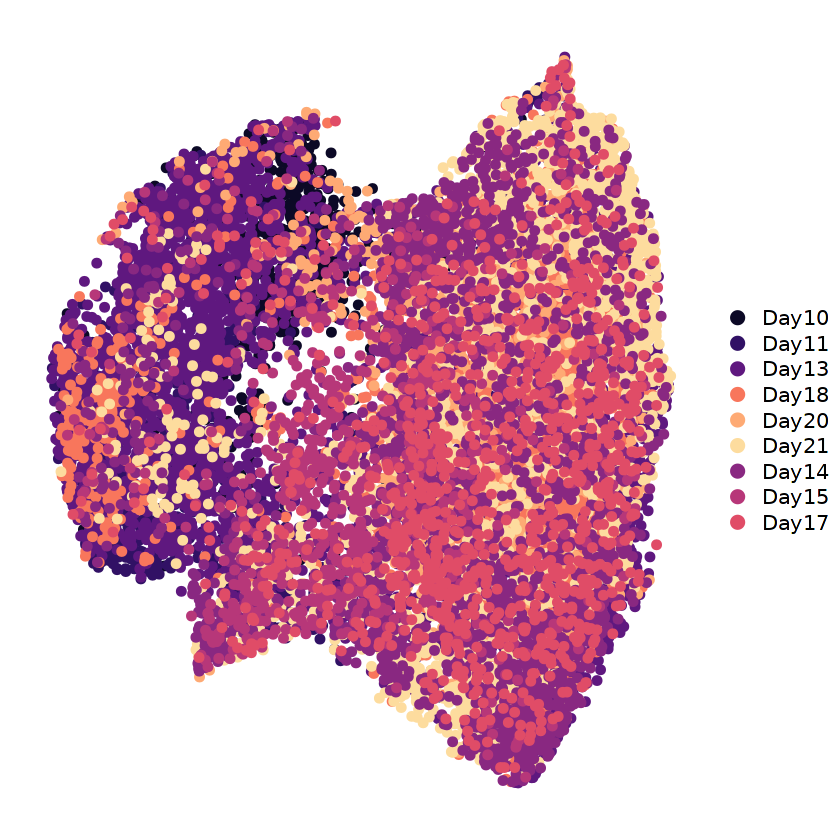

In [13]:
magma_29 <- c(
  '#000004',
  '#040414',
  '#0C0926',
  '#160F3B',
  '#221150',
  '#311165',
  '#400F74',
  '#51127C',
  '#5F187F',
  '#6D1D81',
  '#7B2382',
  '#892881',
  '#982D80',
  '#A6317D',
  '#B73779',
  '#C53C74',
  '#D3436E',
  '#E04C67',
  '#EB5760',
  '#F3655C',
  '#F8765C',
  '#FC8961',
  '#FD9A6A',
  '#FEAA74',
  '#FEBB81',
  '#FECC8F',
  '#FDDC9E',
  '#FCECAE',
  '#FCFDBF'
)


pal_days <- c(
  "Day10" = magma_29[3],
  "Day11" = magma_29[6],
  "Day13" = magma_29[9],
  "Day14" = magma_29[12],
  "Day15" = magma_29[15],
  "Day17" = magma_29[18],
  "Day18" = magma_29[21],
  "Day20" = magma_29[24],
  "Day21" = magma_29[27]
  )


#BuYlRd_Ed <- c('#D53E4F','#F46D43','#FDAE61', '#fcd462', '#f0f0a8','#ABD9E9','#74ADD1','#4575B4','#5e4fa2')

p <- DimPlot(
  Alpha_subset,
  reduction = "umap",
  group.by  = "day",
  label     = FALSE,
    pt.size = 1.8 ,   
  order     = c("Day17","Day15","Day14","Day21", "Day20","Day18",  "Day13","Day11","Day10"),
  cols      = pal_days
) +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. S20B

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_Alpha/umap_DT_Alpha_day_legend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)


In [7]:
get_first_cell_by_umap <- function(
  Alpha_subset,
  reduction = "umap",
  umap1_low  = -3.1,   # lower bound (order doesn't matter; will be sorted)
  umap1_high = -3,  # upper bound
  umap2_low  = 3.4,  # lower bound
  umap2_high = 3.5,  # upper bound
  inclusive = FALSE,
  n = 1,            # how many cell names to return (1 = first)
  error_on_empty = TRUE
) {
  emb <- Seurat::Embeddings(Alpha_subset, reduction = reduction)

  # Try to detect the two UMAP dims
  col1 <- grep("_1$", colnames(emb), value = TRUE)
  col2 <- grep("_2$", colnames(emb), value = TRUE)
  if (length(col1) != 1 || length(col2) != 1) {
    stop("Could not uniquely identify UMAP_1 and UMAP_2 columns.")
  }

  # Normalize bounds (so low <= high even if user swaps them)
  rng1 <- sort(c(umap1_low, umap1_high))
  rng2 <- sort(c(umap2_low, umap2_high))

  x1 <- emb[, col1]
  x2 <- emb[, col2]

  if (inclusive) {
    hits <- which(x1 >= rng1[1] & x1 <= rng1[2] &
                  x2 >= rng2[1] & x2 <= rng2[2])
  } else {
    hits <- which(x1 >  rng1[1] & x1 <  rng1[2] &
                  x2 >  rng2[1] & x2 <  rng2[2])
  }

  if (length(hits) == 0) {
    if (error_on_empty) stop("No cells found meeting the UMAP criteria.")
    return(NA_character_)
  }

  hits <- hits[seq_len(min(n, length(hits)))]
  rownames(emb)[hits]
}

# Examples:
# get_first_cell_by_umap(Alpha_subset)                     # first hit (default ranges)
 get_first_cell_by_umap(Alpha_subset, n = 5)              # first 5 hits
# get_first_cell_by_umap(Alpha_subset, inclusive = TRUE)
# get_first_cell_by_umap(Alpha_subset, error_on_empty = FALSE)  # returns NA if none


[1] "s4d2_CTGCTCCCAATATGGA-1_paired" "s5d1_TAAGCTGGTACCTTAC-1_paired"

In [8]:
# 1) Convert Seurat -> CDS
seurat_cds <- as.cell_data_set(Alpha_subset)

# 2) Grab the UMAP you want from Seurat
umap <- Embeddings(Alpha_subset, "umap")  # rows = cells, cols = UMAP1/2

# 3) Make sure cell names match and are in the same order
common <- intersect(rownames(umap), colnames(seurat_cds))
seurat_cds <- seurat_cds[, common]          # subset cds to shared cells (keeps order of 'common')
umap  <- umap[common, , drop = FALSE]

# 4) Set it as the UMAP in the CDS (name must be exactly "UMAP")
reducedDims(seurat_cds)$UMAP <- umap

# (optional) carry over Seurat clusters/metadata
colData(seurat_cds)$seurat_clusters <- Idents(Alpha_subset)[common]

# 5) Now cluster in Monocle3 using that UMAP space
seurat_cds <- cluster_cells(seurat_cds, reduction_method = "UMAP")

Warning message:
“`invoke()` is deprecated as of rlang 0.4.0.
Please use `exec()` or `inject()` instead.
This warning is displayed once every 8 hours.”
Warning message:
“Monocle 3 trajectories require cluster partitions, which Seurat does not calculate. Please run 'cluster_cells' on your cell_data_set object”


  |======================================================================| 100%


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


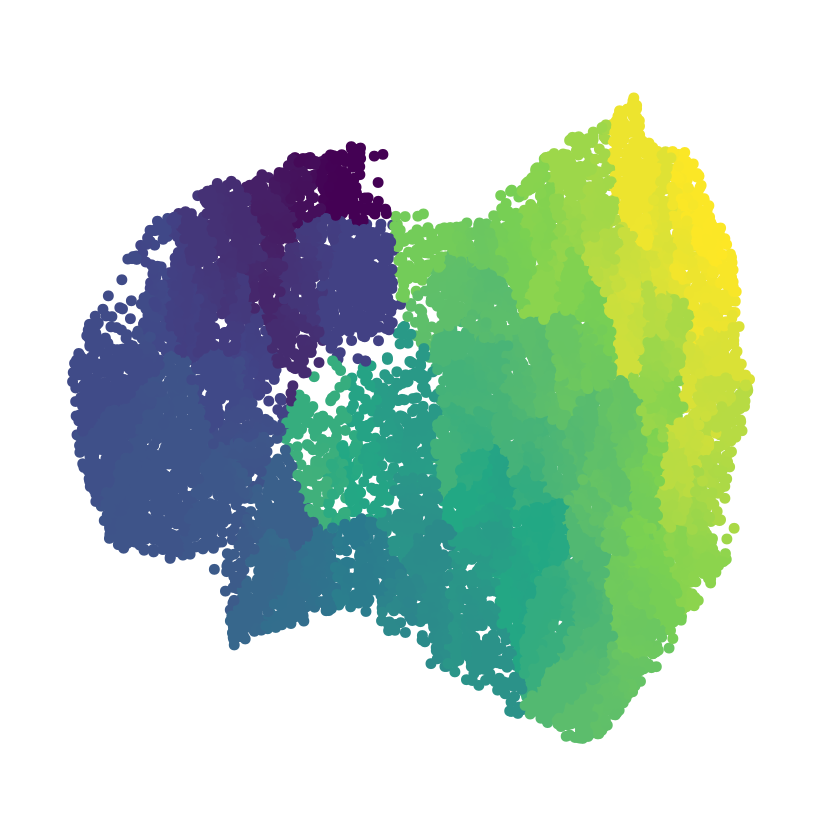

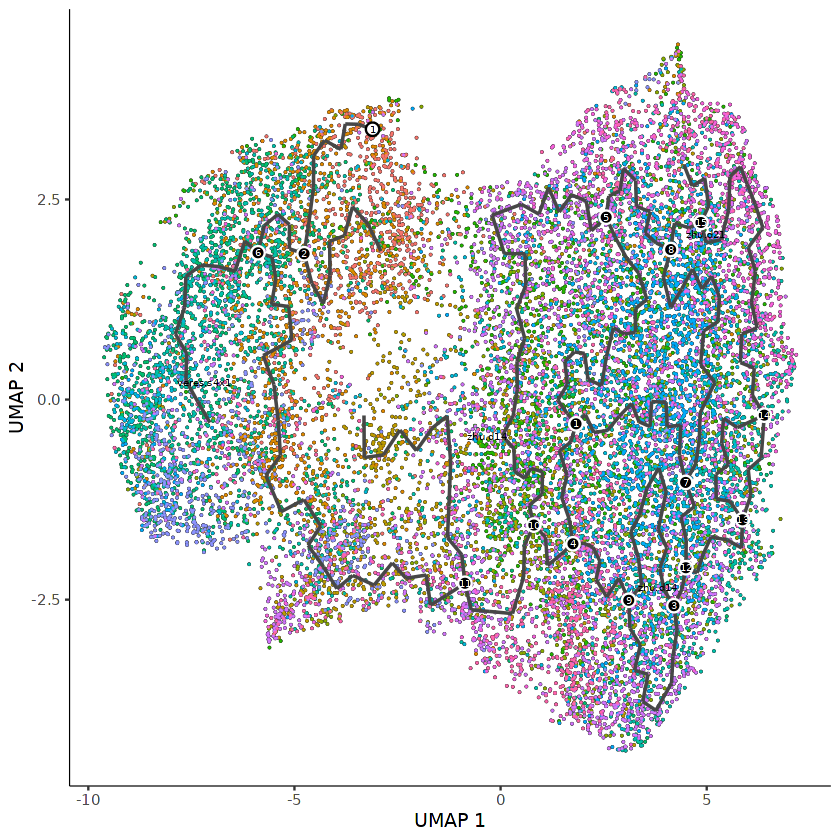

In [12]:
# If you then want a trajectory:
seurat_cds <- learn_graph(seurat_cds, use_partition=TRUE, learn_graph_control=list(ncenter= 420), verbose=FALSE) #515T

# i_cds <- order_cells(i_cds, root_cells = <vector_of_root_cell_names>)

seurat_cds <- order_cells(seurat_cds, reduction_method = "UMAP",
                          root_cells = 's4d2_CTGCTCCCAATATGGA-1_paired') #s4d2_CTGCTCCCAATATGGA s4d2_GCTGGTTCATAGGCGA

Alpha_subset <- AddMetaData(
  object = Alpha_subset,
  metadata = seurat_cds@principal_graph_aux@listData$UMAP$pseudotime,
  col.name = "pseudotime_Alpha_subset") 

f1 <- FeaturePlot(Alpha_subset, c('pseudotime_Alpha_subset'), reduction = 'umap', pt.size = 1.8) +
  scale_color_viridis_c()
f1 <- f1 + theme(legend.position = "none") +
      NoAxes() +
      theme(plot.title = element_blank()) +
      labs(x = NULL, y = NULL)

f1 #Fig. S20F

plot_cells(seurat_cds, color_cells_by="orig.ident", label_groups_by_cluster=TRUE, label_leaves=FALSE, label_branch_points=TRUE)


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


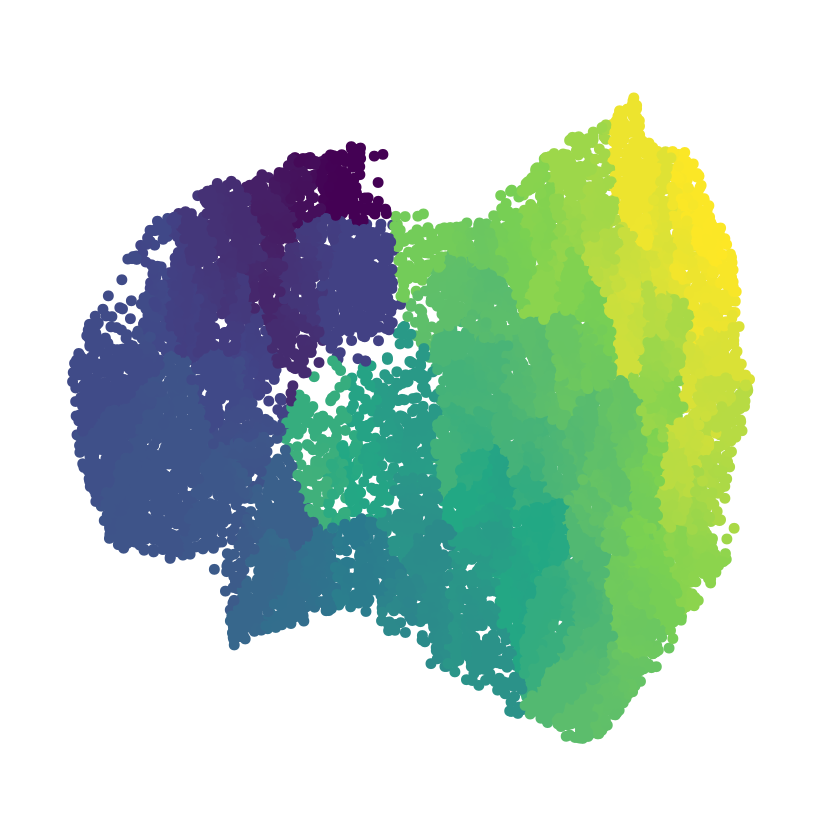

In [13]:

f1 <- FeaturePlot(Alpha_subset, c('pseudotime_Alpha_subset'), reduction = 'umap', pt.size = 1.8) +
  scale_color_viridis_c()
f1 <- f1 + theme(legend.position = "none") +
      NoAxes() +
      theme(plot.title = element_blank()) +
      labs(x = NULL, y = NULL)

f1 #Fig. S20F

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_Alpha/umap_DT_Alpha_pseudotime_nolegend_noaxis.png",
  plot     = f1,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)

In [ ]:
plot_cells(seurat_cds, color_cells_by="orig.ident", label_groups_by_cluster=TRUE, label_leaves=FALSE, label_branch_points=TRUE)

In [ ]:
f1 <- FeaturePlot(Alpha_subset, c('pseudotime_Alpha_subset'), reduction = 'umap', pt.size = 1.8) +
  scale_color_viridis_c()
f1 <- f1

f1

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_Alpha/umap_DT_Alpha_pseudotime_legend_axis.png",
  plot     = f1,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)

In [16]:
saveRDS(Alpha_subset, file = "checkpoints/DT_Subset_Alpha.rds")

# Other plots

In [3]:
Alpha_subset <- readRDS("checkpoints/DT_Subset_Alpha.rds")

In [4]:
Alpha_subset

An object of class Seurat 
95325 features across 16122 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message in plot_theme(plot):
“The `panel.margin` theme element is not defined in the element hierarchy.”
Warning message:
“Removed 40 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message in plot_theme(plot):
“The `panel.margin` theme element is not defined in the element hierarchy.”
Warning message:
“Removed 40 rows containing missing values or values outside the scale range
(`geom_point()`).”


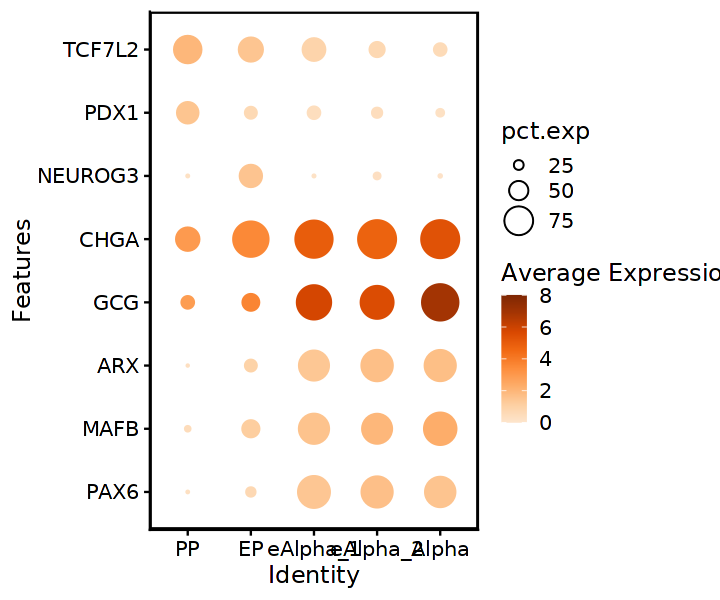

In [13]:
order_ct <- c('PP', 'EP', 'eAlpha_1','eAlpha_2', 'Alpha')

DefaultAssay(Alpha_subset) <- "RNA"
Idents(Alpha_subset) <- "celltype_Alpha_subset"

# Force the order
Alpha_subset$celltype_Alpha_subset <- factor(
  Alpha_subset$celltype_Alpha_subset,
  levels = order_ct
)
Idents(Alpha_subset) <- "celltype_Alpha_subset"

#Ed colors
library(RColorBrewer)

# Palette (same as your FeaturePlots)
oranges_pal <- colorRampPalette(brewer.pal(9, "Oranges")[2:9])

# Gene Expression Dotplot
DefaultAssay(Alpha_subset) <- "RNA"
Idents(Alpha_subset) <- "celltype_Alpha_subset"

genes <- c(
    'PAX6','MAFB',
    'ARX','GCG','CHGA','NEUROG3', 
    'PDX1','TCF7L2'
)

options(repr.plot.width = 6, repr.plot.height = 5)

dp_celltype <- DotPlot(
  Alpha_subset,
  features  = genes,
  dot.scale = 10,
  scale     = FALSE    # 🔴 keep raw avg.exp, so 0–8 is meaningful
) +  
  geom_point(
    aes(size = pct.exp),
    shape  = 21,
    colour = NA,
    stroke = 0.5
  ) +
  coord_flip() +
  # 🔴 same color scale as FeaturePlot: 0–8, Oranges[2:9]
  scale_colour_gradientn(
    limits  = c(0, 8),
    colours = oranges_pal(100)
  ) +  
  guides(
    size = guide_legend(
      override.aes = list(shape = 21, colour = "black", fill = "white")
    )
  ) +
  theme(
    panel.border     = element_rect(colour = "black", fill = NA, size = 1),
    panel.margin     = unit(0, "cm"),
    panel.background = element_rect(fill = "white")
  )

dp_celltype #Fig. S20D

ggsave(
    filename = file.path('outputs/celloracle_figures/DT_Subset_Alpha/RNA_Expression_DotPlot_withscale.png'),
    plot     = dp_celltype,
    width    = 3, height = 3, units = "in",
    dpi      = 600,
    bg       = "white",
    device   = ragg::agg_png  # crisp text/lines
  )

In [ ]:
order_ct <- c('PP', 'EP', 'eAlpha_1','eAlpha_2', 'Alpha')

DefaultAssay(Alpha_subset) <- "RNA"
Idents(Alpha_subset) <- "celltype_Alpha_subset"

# Force the order
Alpha_subset$celltype_Alpha_subset <- factor(
  Alpha_subset$celltype_Alpha_subset,
  levels = order_ct
)
Idents(Alpha_subset) <- "celltype_Alpha_subset"

#Ed colors
library(RColorBrewer)

# Palette (same as your FeaturePlots)
oranges_pal <- colorRampPalette(brewer.pal(9, "Oranges")[2:9])

# Gene Expression Dotplot
DefaultAssay(Alpha_subset) <- "RNA"
Idents(Alpha_subset) <- "celltype_Alpha_subset"

genes <- c(
    'PAX6','MAFB',
    'ARX','GCG','CHGA','NEUROG3', 
    'PDX1','TCF7L2'
)

options(repr.plot.width = 6, repr.plot.height = 5)

dp_celltype <- DotPlot(
  Alpha_subset,
  features  = genes,
  dot.scale = 10,
  scale     = FALSE    # 🔴 keep raw avg.exp, so 0–8 is meaningful
) +  
  NoLegend() +
  geom_point(
    aes(size = pct.exp),
    shape  = 21,
    colour = NA,
    stroke = 0.5
  ) +
  coord_flip() +
  # 🔴 same color scale as FeaturePlot: 0–8, Oranges[2:9]
  scale_colour_gradientn(
    limits  = c(0, 8),
    colours = oranges_pal(100)
  ) +  
  NoAxes() +
  guides(
    size = guide_legend(
      override.aes = list(shape = 21, colour = "black", fill = "white")
    )
  ) +
  theme(
    panel.border     = element_rect(colour = "black", fill = NA, size = 1),
    panel.margin     = unit(0, "cm"),
    panel.background = element_rect(fill = "white")
  )

dp_celltype #Fig. S20D

ggsave(
    filename = file.path('outputs/celloracle_figures/DT_Subset_Alpha/RNA_Expression_DotPlot.png'),
    plot     = dp_celltype,
    width    = 3, height = 3, units = "in",
    dpi      = 600,
    bg       = "white",
    device   = ragg::agg_png  # crisp text/lines
  )

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: PAX6

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: MAFB

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: ARX

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: GCG

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: CHGA

Scale for colour is already present.
Adding another scale for colour,

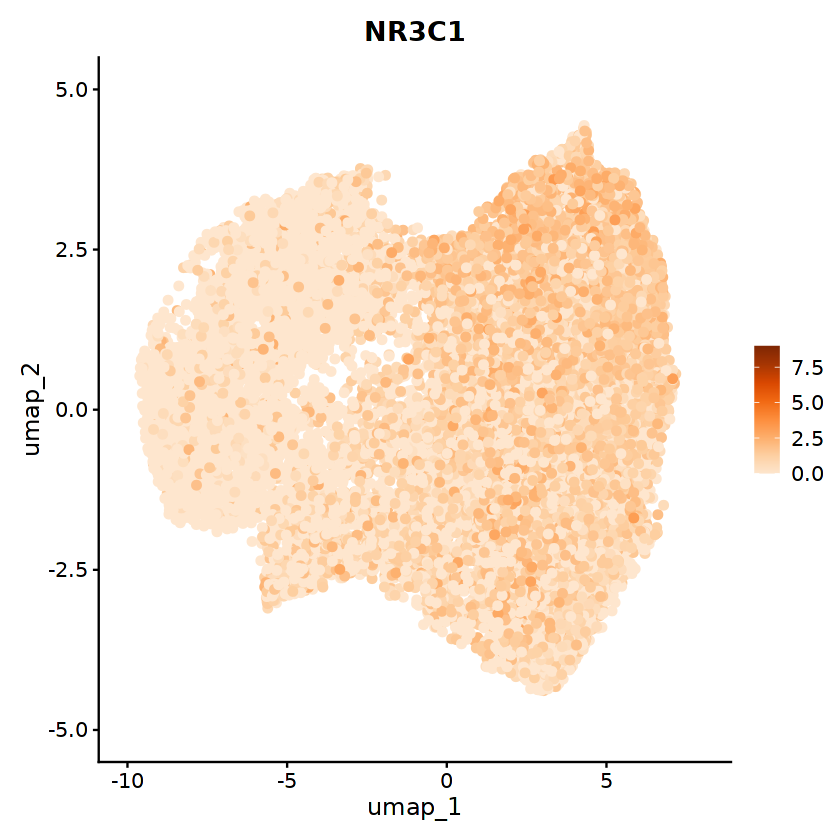

In [5]:
#Save Feature Plots

oranges_pal <- colorRampPalette(brewer.pal(9, "Oranges")[2:9])  # or [4:9] for even darker

# Genes you want to plot
genes_to_plot <- c(
    'PAX6','MAFB',
    'ARX','GCG','CHGA','NEUROG3', 
    'PDX1','TCF7L2','NR3C1'
)


# Output directory
out_dir <- "outputs/celloracle_figures/DT_Subset_Alpha"
dir.create(out_dir, recursive = TRUE, showWarnings = FALSE)

for (g in genes_to_plot) {
  p <- FeaturePlot(
    Alpha_subset,
    features  = g,
    reduction = "umap",
    pt.size   = 1.8
  ) + scale_color_gradientn(limits  = c(0, 9),  colours = oranges_pal(100))
  
  ggsave(
    filename = file.path(out_dir, paste0("umap_DT_Alpha_", g, "_legend_axis.png")),
    plot     = p,
    width    = 7, height = 7, units = "in",
    dpi      = 600,
    bg       = "white",
    device   = ragg::agg_png  # crisp text/lines
  )
  
  message("Saved: ", g)
}

# Optionally display the last one
p #Fig. S20E


In [ ]:
#Save Feature Plots

oranges_pal <- colorRampPalette(brewer.pal(9, "Oranges")[2:9])  # or [4:9] for even darker

# Genes you want to plot
genes_to_plot <- c(
    'PAX6','MAFB',
    'ARX','GCG','CHGA','NEUROG3', 
    'PDX1','TCF7L2','NR3C1'
)


# Output directory
out_dir <- "outputs/celloracle_figures/DT_Subset_Alpha"
dir.create(out_dir, recursive = TRUE, showWarnings = FALSE)

for (g in genes_to_plot) {
  p <- FeaturePlot(
    Alpha_subset,
    features  = g,
    reduction = "umap",
    pt.size   = 1.8
  ) + NoLegend() + NoAxes()  +ggtitle('') + scale_color_gradientn(limits  = c(0, 5),  colours = oranges_pal(100))
  
  ggsave(
    filename = file.path(out_dir, paste0("umap_DT_Alpha_", g, "_legend_axis.png")),
    plot     = p,
    width    = 7, height = 7, units = "in",
    dpi      = 600,
    bg       = "white",
    device   = ragg::agg_png  # crisp text/lines
  )
  
  message("Saved: ", g)
}

# Optionally display the last one
p #Fig. S20J


# Export for Python

In [36]:
saveRDS(Alpha_subset, file = "checkpoints/DT_Subset_Alpha.rds")

In [37]:
Alpha_subset <- readRDS( file = "checkpoints/DT_Subset_Alpha.rds")

In [39]:
#Export for Python for future analysis

#Set working directory
setwd("/storage1/fs1/jmillman/Active/DigitalTwin")

# write matrix data (gene expression counts) 
counts_matrix <- GetAssayData(Alpha_subset, assay='RNA', slot='counts')
writeMM(counts_matrix, file=paste0(file='checkpoints/DT_Subset_Alpha_matrix.mtx'))

# write dimensional reduction matrix (PCA)
write.csv (Alpha_subset@reductions$pca@cell.embeddings, 
           file='checkpoints/DT_Subset_Alpha_pca.csv', quote=F, row.names=F)

# write gene names
write.table(data.frame('gene'=rownames(counts_matrix)),
            file='checkpoints/DT_Subset_Alpha_gene_names.csv',
            quote=F,row.names=F,col.names=F)

# save metadata table:
Alpha_subset$barcode <- colnames(Alpha_subset)
Alpha_subset$UMAP_1 <- Alpha_subset@reductions$umap@cell.embeddings[,1]
Alpha_subset$UMAP_2 <- Alpha_subset@reductions$umap@cell.embeddings[,2]
write.csv(Alpha_subset@meta.data, file='checkpoints/DT_Subset_Alpha_metadata.csv', 
          quote=F, row.names=F)

red <- Alpha_subset@reductions
red
for (reduction_name in names(red)){
    write.csv(as.data.frame(red[reduction_name][[1]]@cell.embeddings),
              file = paste0("checkpoints/DT_Subset_Alpha_", reduction_name,  ".csv"))
  }


NULL

$RNAHARMONY
A dimensional reduction object with key RNAHARMONY_ 
 Number of dimensions: 50 
 Number of cells: 16122 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: RNA 

$RNAINTEGRATED_LSI
A dimensional reduction object with key RNAINTEGRATEDLSI_ 
 Number of dimensions: 30 
 Number of cells: 16122 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: RNA 

$RNAMULTIVI
A dimensional reduction object with key RNAMULTIVI_ 
 Number of dimensions: 50 
 Number of cells: 16122 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: RNA 

$RNAPCA
A dimensional reduction object with key RNAPCA_ 
 Number of dimensions: 50 
 Number of cells: 16122 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: RNA 

$RNAUMAP
A dimensional reduction object with key RNAUMAP_ 
 Number of dimensions: 2 
 Number of cells: 1612

In [64]:
# Anoche no pude dormir pensando en vos, mujer - El Genio del Dub by Los Fabulosos Cadillacs